**PROJECT INFORMATION**

### Build Unsupervised & Supervised Learning Models using Python

#### Anjala - 055005


#### DESCRIPTION OF DATA
### Data Information

- **Data Size:** 2.56 MB  
- **Data Type:** Panel  

### Data Dimension  
- **No. of Variables:** 16  
- **No. of Observations:** 15,000  

---

## Data Variable Type

### Numeric  
- **Integer:** Quantity, Customs_Code, Invoice_Number  
- **Decimal:** Value, Weight  

### Non-Numeric  
Transaction_ID, Customs_Code, Invoice_Number, Product, Supplier, Cu,  Shipping_Method, Countrysomer, Date, Port  

---

## Data Variable Category - I  

### Categorical  
- **Nominal:** Import_Export, Category, Shipping_Method, Payment_Terms, Country  
- **Ordinal:**  

### Non-Categorical  
Quantity, Value, Weight
---

## Data Variable Category - II  

- **Transaction_ID:** Unique identifier for each trade transaction.  
- **Country:** Country of origin or destination for the trade.  
- **Product:** Product being traded.  
- **Import_Export:** Indicates whether the transaction is an import or export.  
- **Quantity:** Amount of the product traded.  
- **Value:** Monetary value of the product in USD.  
- **Date:** Date of the transaction.  
- **Category:** Category of the product (e.g., Electronics, Clothing, Machinery).  
- **Port:** Port of entry or departure.  
- **Customs_Code:** Customs or HS code for product classification.  
- **Weight:** Weight of the product in kilograms.  
- **Shipping_Method:** Method used for shipping (e.g., Air, Sea, Land).  
- **Supplier:** Name of the supplier or manufacturer.  
- **Customer:** Name of the customer or recipient.  
- **Invoice_Number:** Unique invoice number for the transaction.  
- **Payment_Terms:** Terms of payment (e.g., Net 30, Net 60, Cash on Delivery).  

---

## About Dataset  

This dataset provides detailed information on international trade transactions, capturing both import and export activities. It includes comprehensive data on various aspects of trade, making it a valuable resource for business analysis, economic research, and financial modeling.

### **Project Objectives**
1. **Data Preprocessing and Cleaning**  
   - Conduct a thorough cleaning and preprocessing of the dataset by handling missing values, encoding categorical variables, and scaling numerical features to ensure the dataset is ready for further analysis.

2. **Exploratory Data Analysis (EDA)**  
   - Perform EDA to uncover patterns, correlations, and outliers in the dataset, visualizing trade trends and relationships between key variables such as `Loan Status`, `Credit Score`, `Annual Income`, `Current Loan Amount`, and `Months since last delinquent`.

3. **Supervised Learning for Predictive Modeling**  
   - Apply supervised machine learning techniques, such as **Logistic Regression**, **Random Forest**, **SVM**, and **XGBoost**, to predict outcomes like `Loan Status` or trade transaction characteristics based on historical data.

4. **Classification for Trade Segmentation**  
   - Develop classification models to predict and segment trade transactions based on various trade characteristics (e.g., product category, shipping method, transaction value), enhancing decision-making on trade strategies.

5. **Clustering for Trade Segmentation**  
   - Use clustering algorithms like **K-Means** or **Hierarchical Clustering** to group trade transactions into meaningful segments, allowing the business to identify high-value categories and optimize trade strategies.

6. **Feature Engineering for Improved Predictions**  
   - Develop new features from existing data (e.g., interaction terms, aggregating transaction data) to improve the predictive power of machine learning models, ensuring more accurate trade volume forecasts.

7. **Anomaly Detection for Fraud and Risk Mitigation**  
   - Implement anomaly detection algorithms to identify irregular trade patterns or potential fraud activities, ensuring compliance and reducing operational risks in trade transactions.

8. **Model Evaluation and Performance Analysis**  
   - Evaluate the performance of both classification and regression models using metrics like accuracy, precision, recall, F1-score, and AUC for classification models, and **MSE** and **R²** for regression models to ensure reliable and robust predictions.

9. **Trade Forecasting and Predictive Insights**  
   - Use time series analysis or regression models to predict future trade volumes, identifying key growth regions or product categories that can inform business strategy and planning.

---

### **Problem Statements**
1. **Data Quality and Preprocessing**  
   - How can we effectively preprocess the dataset to handle missing values, encode categorical variables, and scale numerical features for machine learning modeling?

2. **Trade Transaction Classification**  
   - What is the best approach to classify trade transactions using supervised learning techniques, and how can models like **Logistic Regression**, **SVM**, and **Random Forest** contribute to predicting trade categories or transaction outcomes?

3. **Key Factors Driving Trade Variations**  
   - What features (e.g., credit score, loan amount, region, shipping weight) most significantly drive variations in trade transactions, and how do these features contribute to forecasting trade dynamics?

4. **Improving Model Accuracy**  
   - How can we refine our supervised learning models to better predict trade outcomes, leveraging feature engineering, hyperparameter tuning, and advanced models like **XGBoost**?

5. **Clustering for Meaningful Segmentation**  
   - How can clustering algorithms like **K-Means** help group trade transactions into meaningful clusters that aid in segmentation for targeted trade strategies?

6. **Anomaly and Fraud Detection**  
   - How can advanced anomaly detection techniques uncover irregularities in trade data that could signify fraud or errors, enabling better risk management?

7. **Trade Forecasting for Strategic Decisions**  
   - Can supervised learning models, particularly regression-based approaches, accurately forecast future trade volumes and product demand based on historical data?

8. **Optimizing Supply Chain and Trade Operations**  
   - What insights can be drawn from the dataset that will optimize supply chain logistics, improve operational efficiency, and guide cost-effective trade strategies?


### ANALYSIS OF DATA & REPORT (at the end)
### Data Preprocessing

In [51]:
#Import relevant libraries
import pandas as pd
import statsmodels.stats.descriptivestats as dstats
import numpy as np  # For Data Manipulation
from sklearn.preprocessing import OrdinalEncoder  # For Encoding Categorical Data [Nominal | Ordinal]
from sklearn.impute import SimpleImputer  # For Imputation of Missing Data
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler  # For Rescaling Data
from sklearn.model_selection import train_test_split  # For Splitting Data into Training & Testing Sets
import matplotlib.pyplot as plt
import seaborn as sns  # For Data Visualization
import scipy.cluster.hierarchy as sch  # For Hierarchical Clustering
from sklearn.cluster import AgglomerativeClustering, KMeans, DBSCAN, Birch
from sklearn.metrics import silhouette_score, davies_bouldin_score
import statsmodels.api as sm
import io
import requests
from scipy.stats import shapiro
from scipy.stats import spearmanr, kendalltau
from scipy.stats import skew, kurtosis, pearsonr, norm
from scipy.stats import chi2_contingency
from scipy import stats

# Google Drive file ID
file_id = "18pqV3IXCGPnyUxDcahtYz-x1m4ndFUrw"

# Construct the Google Drive download URL
url = f"https://drive.google.com/uc?id={file_id}"

# Send the GET request to the file URL
response = requests.get(url)
data = io.StringIO(response.text)
ac05_df = pd.read_csv(data)
ac05_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Transaction_ID   15000 non-null  object 
 1   Country          15000 non-null  object 
 2   Product          15000 non-null  object 
 3   Import_Export    15000 non-null  object 
 4   Quantity         15000 non-null  int64  
 5   Value            15000 non-null  float64
 6   Date             15000 non-null  object 
 7   Category         15000 non-null  object 
 8   Port             15000 non-null  object 
 9   Customs_Code     15000 non-null  int64  
 10  Weight           15000 non-null  float64
 11  Shipping_Method  15000 non-null  object 
 12  Supplier         15000 non-null  object 
 13  Customer         15000 non-null  object 
 14  Invoice_Number   15000 non-null  int64  
 15  Payment_Terms    15000 non-null  object 
dtypes: float64(2), int64(3), object(11)
memory usage: 1.8+ MB


In [52]:
ac05_df.head()

,Transaction_ID,Country,Product,Import_Export,Quantity,Value,Date,Category,Port,Customs_Code,Weight,Shipping_Method,Supplier,Customer,Invoice_Number,Payment_Terms
0,e3e70682-c209-4cac-a29f-6fbed82c07cd,Colombia,describe,Export,1979,9506.57,07-12-2023,Machinery,Robertbury,620537,4248.65,Air,"Garrison, Hubbard and Hendricks",Seth Hall,21000294,Cash on Delivery
1,f728b4fa-4248-4e3a-8a5d-2f346baa9455,Chile,president,Export,5763,7100.91,04-04-2023,Clothing,Shahport,927600,4340.81,Air,Webb-Mack,Kimberly Ryan,88738432,Prepaid
2,eb1167b3-67a9-4378-bc65-c1e582e2e662,Turkey,far,Import,5740,2450.34,21-08-2024,Electronics,South Joshuatown,299258,4538.41,Air,"Mendez, Jones and Johnson",Ryan Silva,89922099,Prepaid
3,f7c1bd87-4da5-4709-9471-3d60c8a70639,Christmas Island,agency,Export,2592,7226.42,09-05-2022,Furniture,Adamfort,996084,4886.14,Air,Schroeder-Smith,Jacob Gray,63216265,Net 60
4,e443df78-9558-467f-9ba9-1faf7a024204,Finland,policy,Export,2622,2817.29,03-04-2023,Electronics,Juliebury,555981,4406.74,Air,Zimmerman LLC,Amy Stephens,94600248,Cash on Delivery


In [53]:
ac05_df = ac05_df.sample(n=5001, random_state=110014)
ac05_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5001 entries, 2396 to 437
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Transaction_ID   5001 non-null   object 
 1   Country          5001 non-null   object 
 2   Product          5001 non-null   object 
 3   Import_Export    5001 non-null   object 
 4   Quantity         5001 non-null   int64  
 5   Value            5001 non-null   float64
 6   Date             5001 non-null   object 
 7   Category         5001 non-null   object 
 8   Port             5001 non-null   object 
 9   Customs_Code     5001 non-null   int64  
 10  Weight           5001 non-null   float64
 11  Shipping_Method  5001 non-null   object 
 12  Supplier         5001 non-null   object 
 13  Customer         5001 non-null   object 
 14  Invoice_Number   5001 non-null   int64  
 15  Payment_Terms    5001 non-null   object 
dtypes: float64(2), int64(3), object(11)
memory usage: 664.2+ KB


In [54]:
#Subset of Non-Categorical Variables
ac05_df_noncat = ac05_df[['Quantity','Value','Weight']]
ac05_df_noncat.head()

,Quantity,Value,Weight
2396,8121,337.41,2958.75
7470,9229,3951.92,1936.73
11831,6519,6755.81,3658.23
5322,9432,2174.49,3808.21
2638,6267,9036.98,681.94


In [55]:
# Subset of categorical variables
ac05_df_cat = ac05_df[['Country','Port','Product','Import_Export', 'Category', 'Shipping_Method', 'Payment_Terms']]
ac05_df_cat.head()

,Country,Port,Product,Import_Export,Category,Shipping_Method,Payment_Terms
2396,Philippines,South Lorettafort,next,Import,Furniture,Air,Prepaid
7470,Suriname,Victoriaside,now,Export,Machinery,Land,Net 30
11831,Cocos (Keeling) Islands,Hubbardmouth,appear,Import,Machinery,Land,Cash on Delivery
5322,Turks and Caicos Islands,Patriciafort,project,Export,Clothing,Air,Prepaid
2638,Antarctica (the territory South of 60 deg S),New Denisechester,speak,Export,Electronics,Land,Net 60


In [56]:
import pandas as pd

def missing_data_summary(df):
    """
    Creates a DataFrame summarizing missing data statistics.

    Args:
        df: The input DataFrame.

    Returns:
        A DataFrame with missing data count and percentage for each variable and row.
    """
    # Column-wise summary
    missing_count_col = df.isnull().sum()
    missing_percentage_col = (missing_count_col / len(df)) * 100
    missing_summary_col = pd.DataFrame({
        'Missing Count': missing_count_col,
        'Missing Percentage': missing_percentage_col
    })

    # Row-wise summary
    missing_count_row = df.isnull().sum(axis=1)
    missing_percentage_row = (missing_count_row / len(df.columns)) * 100
    missing_summary_row = pd.DataFrame({
        'Missing Count': missing_count_row,
        'Missing Percentage': missing_percentage_row
    }, index=df.index)  # Use original DataFrame index

    return missing_summary_col, missing_summary_row


def handle_missing_data(df, row_threshold=50, col_threshold=50):
    """
    Handles missing data by dropping rows and columns exceeding the threshold.

    Args:
        df: The input DataFrame.
        row_threshold: Percentage of missing data in rows to tolerate before dropping.
        col_threshold: Percentage of missing data in columns to tolerate before dropping.

    Returns:
        Cleaned DataFrame and counts of dropped rows/columns.
    """
    # Calculate row and column thresholds in terms of counts
    row_thresh_count = len(df.columns) * (1 - row_threshold / 100)
    col_thresh_count = len(df) * (1 - col_threshold / 100)

    # Drop rows and columns based on thresholds
    df_cleaned = df.dropna(thresh=row_thresh_count, axis=0)  # Drop rows
    df_cleaned = df_cleaned.dropna(thresh=col_thresh_count, axis=1)  # Drop columns

    # Calculate dropped rows and columns
    dropped_rows = len(df) - len(df_cleaned)
    dropped_columns = len(df.columns) - len(df_cleaned.columns)

    return df_cleaned, dropped_rows, dropped_columns


# Example usage
# Assume `ac05_df_cat` (categorical subset) and `ac05_df_noncat` (non-categorical subset) are defined

# Categorical missing data summary
ac05_missing_summary_cat_col, ac05_missing_summary_cat_row = missing_data_summary(ac05_df_cat)

# Non-Categorical missing data summary
ac05_missing_summary_noncat_col, ac05_missing_summary_noncat_row = missing_data_summary(ac05_df_noncat)

# Handle missing data for categorical subset
ac05_df_cat_treated, ac05_dropped_rows_cat, ac05_dropped_columns_cat = handle_missing_data(ac05_df_cat)

# Handle missing data for non-categorical subset
ac05_df_noncat_treated, ac05_dropped_rows_noncat, ac05_dropped_columns_noncat = handle_missing_data(ac05_df_noncat)

# Total dropped variables and rows
ac05_total_dropped_variables = ac05_dropped_columns_cat + ac05_dropped_columns_noncat
ac05_total_dropped_rows = ac05_dropped_rows_cat + ac05_dropped_rows_noncat

# Print missing data summaries and dropped counts
print("Categorical Missing Data Summary (Columns):")
print(ac05_missing_summary_cat_col)
print("\nCategorical Missing Data Summary (Rows):")
print(ac05_missing_summary_cat_row)
print("\nNon-Categorical Missing Data Summary (Columns):")
print(ac05_missing_summary_noncat_col)
print("\nNon-Categorical Missing Data Summary (Rows):")
print(ac05_missing_summary_noncat_row)
print(f"\nTotal variables dropped: {ac05_total_dropped_variables}")
print(f"Total rows dropped: {ac05_total_dropped_rows}")


Categorical Missing Data Summary (Columns):
                 Missing Count  Missing Percentage
Country                      0                 0.0
Port                         0                 0.0
Product                      0                 0.0
Import_Export                0                 0.0
Category                     0                 0.0
Shipping_Method              0                 0.0
Payment_Terms                0                 0.0

Categorical Missing Data Summary (Rows):
       Missing Count  Missing Percentage
2396               0                 0.0
7470               0                 0.0
11831              0                 0.0
5322               0                 0.0
2638               0                 0.0
...              ...                 ...
13867              0                 0.0
5096               0                 0.0
5973               0                 0.0
3845               0                 0.0
437                0                 0.0

[5001 rows x 

In [57]:
# Create imputers for categorical and non-categorical data
ac05_imputer_cat = SimpleImputer(strategy='most_frequent')  # Mode for categorical
ac05_imputer_noncat = SimpleImputer(strategy='mean')  # Mean for non-categorical

# Fit and transform imputers on the treated datasets
ac05_df_cat_imputed = pd.DataFrame(ac05_imputer_cat.fit_transform(ac05_df_cat_treated),
                                  columns=ac05_df_cat_treated.columns,
                                  index=ac05_df_cat_treated.index)
ac05_df_noncat_imputed = pd.DataFrame(ac05_imputer_noncat.fit_transform(ac05_df_noncat_treated),
                                    columns=ac05_df_noncat_treated.columns,
                                    index=ac05_df_noncat_treated.index)

# Count imputed values
ac05_imputed_count_cat = ac05_df_cat_imputed.isnull().sum().sum() - ac05_df_cat_treated.isnull().sum().sum()
ac05_imputed_count_noncat = ac05_df_noncat_imputed.isnull().sum().sum() - ac05_df_noncat_treated.isnull().sum().sum()

# Print head of imputed datasets
print("Imputed Categorical Dataset:")
print(ac05_df_cat_imputed.head())

print("\nHead of Imputed Non-Categorical Dataset:")
print(ac05_df_noncat_imputed.head())

# Print count of imputed values
print(f"\nNumber of imputed values in categorical dataset: {ac05_imputed_count_cat}")
print(f"Number of imputed values in non-categorical dataset: {ac05_imputed_count_noncat}")

Imputed Categorical Dataset:
                                            Country               Port  \
2396                                    Philippines  South Lorettafort   
7470                                       Suriname       Victoriaside   
11831                       Cocos (Keeling) Islands       Hubbardmouth   
5322                       Turks and Caicos Islands       Patriciafort   
2638   Antarctica (the territory South of 60 deg S)  New Denisechester   

       Product Import_Export     Category Shipping_Method     Payment_Terms  
2396      next        Import    Furniture             Air           Prepaid  
7470       now        Export    Machinery            Land            Net 30  
11831   appear        Import    Machinery            Land  Cash on Delivery  
5322   project        Export     Clothing             Air           Prepaid  
2638     speak        Export  Electronics            Land            Net 60  

Head of Imputed Non-Categorical Dataset:
       Quantity 

In [58]:
# Encoding
# Select categorical columns with text data
ac05_categorical_cols_text = ac05_df_cat_imputed.select_dtypes(include=['object']).columns

# Create OrdinalEncoder
ac05_encoder = OrdinalEncoder()

# Fit and transform encoder on selected columns
ac05_df_cat_encoded = ac05_df_cat_imputed.copy()  # Create a copy to avoid modifying the original
ac05_df_cat_encoded[ac05_categorical_cols_text] = ac05_encoder.fit_transform(ac05_df_cat_imputed[ac05_categorical_cols_text])

# Display encoded dataset
print("\nEncoded Categorical Dataset:")
print(ac05_df_cat_encoded.head())



Encoded Categorical Dataset:
       Country    Port  Product  Import_Export  Category  Shipping_Method  \
2396     171.0  3628.0    542.0            1.0       2.0              0.0   
7470     206.0  3910.0    553.0            0.0       3.0              1.0   
11831     46.0  1211.0     59.0            1.0       3.0              1.0   
5322     224.0  2791.0    646.0            0.0       0.0              0.0   
2638       7.0  2231.0    783.0            0.0       1.0              1.0   

       Payment_Terms  
2396             3.0  
7470             1.0  
11831            0.0  
5322             3.0  
2638             2.0  


In [59]:
# Display encoding mapping
for col in ac05_categorical_cols_text:
    print(f"\nEncoding Mapping for {col}:")
    for i, category in enumerate(ac05_encoder.categories_[ac05_categorical_cols_text.get_loc(col)]):
      print(f"{category} -> {i}")

Streaming output truncated to the last 5000 lines.
Camachoburgh -> 297
Camachoport -> 298
Cameronborough -> 299
Cameronhaven -> 300
Cameronshire -> 301
Campbellmouth -> 302
Campbellside -> 303
Campbellton -> 304
Camposshire -> 305
Candiceshire -> 306
Cannonborough -> 307
Carlaburgh -> 308
Carlburgh -> 309
Carlosmouth -> 310
Carlsonborough -> 311
Carlsonburgh -> 312
Carlsonport -> 313
Carlsonton -> 314
Carlyfurt -> 315
Carmenberg -> 316
Carneybury -> 317
Carneychester -> 318
Carolborough -> 319
Carolview -> 320
Carpenterborough -> 321
Carrborough -> 322
Carrillofort -> 323
Carrilloside -> 324
Carrollhaven -> 325
Carrollland -> 326
Carrollmouth -> 327
Carrton -> 328
Cartermouth -> 329
Carterville -> 330
Cassandrafort -> 331
Castanedahaven -> 332
Castrotown -> 333
Castroville -> 334
Catherineburgh -> 335
Catherinemouth -> 336
Catherineshire -> 337
Catherineville -> 338
Cathyfort -> 339
Cathymouth -> 340
Cathyshire -> 341
Cervantesmouth -> 342
Cesarside -> 343
Chadmouth -> 344
Chambersstad

In [60]:
# Check normality using Shapiro-Wilk test
ac05_normality_results = {}
for col in ac05_df_noncat_imputed.columns:
    _, p_value = shapiro(ac05_df_noncat_imputed[col])
    ac05_normality_results[col] = p_value

# Identify non-normally distributed variables
ac05_non_normal_vars = [col for col, p_value in ac05_normality_results.items() if p_value < 0.05]

# Scale non-normally distributed variables using MinMaxScaler
ac05_scaler = MinMaxScaler()
ac05_df_noncat_scaled = ac05_df_noncat_imputed.copy()  # Create a copy to avoid modifying the original
ac05_df_noncat_scaled[ac05_non_normal_vars] = ac05_scaler.fit_transform(ac05_df_noncat_imputed[ac05_non_normal_vars])

# Display scaled dataset
print("\nScaled Non-Categorical Dataset:")
print(ac05_df_noncat_scaled.head())

# Display scaled variables
print("\nVariables that were scaled:")
print(ac05_non_normal_vars)


Scaled Non-Categorical Dataset:
       Quantity     Value    Weight
2396   0.812256  0.023776  0.591599
7470   0.923200  0.389028  0.386992
11831  0.651847  0.672365  0.731634
5322   0.943527  0.209416  0.761660
2638   0.626615  0.902880  0.135785

Variables that were scaled:
['Quantity', 'Value', 'Weight']


/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


In [61]:
# Merge encoded categorical and scaled non-categorical datasets into original dataset
ac05_df_preprocessed = ac05_df.copy()  # Create a copy of the original dataset

# Replace categorical columns with encoded values
ac05_df_preprocessed[ac05_df_cat_encoded.columns] = ac05_df_cat_encoded

# Replace non-categorical columns with scaled values
ac05_df_preprocessed[ac05_df_noncat_scaled.columns] = ac05_df_noncat_scaled

ac05_df_preprocessed.head()

,Transaction_ID,Country,Product,Import_Export,Quantity,Value,Date,Category,Port,Customs_Code,Weight,Shipping_Method,Supplier,Customer,Invoice_Number,Payment_Terms
2396,2a2e0ea7-5834-4eaf-8f33-2bab9e051c94,171.0,542.0,1.0,0.812256,0.023776,07-06-2021,2.0,3628.0,139327,0.591599,0.0,Weaver PLC,Nathan Fisher,20985834,3.0
7470,c844e82b-952c-40d9-87e6-457fb344e9eb,206.0,553.0,0.0,0.923200,0.389028,22-12-2023,3.0,3910.0,720369,0.386992,1.0,"Love, Proctor and Garcia",Timothy Gibbs,37415950,1.0
11831,d63f8fc3-39e8-4d7d-a138-a21c623de753,46.0,59.0,1.0,0.651847,0.672365,03-07-2023,3.0,1211.0,263267,0.731634,1.0,Trevino and Sons,Justin Taylor,82965932,0.0
5322,13337bb7-168c-4202-85d3-3f0978dfcadf,224.0,646.0,0.0,0.943527,0.209416,18-11-2022,0.0,2791.0,460290,0.761660,0.0,Foster-Barber,Joseph Evans,71448135,3.0
2638,8b680b6a-6c9d-44e8-9ccc-0c1ddd5c4caf,7.0,783.0,0.0,0.626615,0.902880,28-11-2021,1.0,2231.0,443091,0.135785,1.0,"Porter, Ford and Johnson",Erica Fowler,70262562,2.0


In [62]:
### Descriptive Statistics

In [63]:
# Function to calculate descriptive statistics for categorical variables
def ac05_categorical_stats(df, cat_columns):
    ac05_results = []

    for ac05_col in cat_columns:
        ac05_counts = df[ac05_col].value_counts()
        ac05_proportions = ac05_counts / len(df)
        ac05_mode = ac05_counts.idxmax()
        ac05_min = df[ac05_col].min()
        ac05_max = df[ac05_col].max()

        for category, count in ac05_counts.items():
            ac05_results.append({
                "Column": ac05_col,
                "Category": category,
                "Frequency": count,
                "Proportion": ac05_proportions[category],
                "Minimum": ac05_min,
                "Maximum": ac05_max,
                "Mode": ac05_mode
            })

    return pd.DataFrame(ac05_results)

# Function to calculate correlation for categorical columns
def ac05_categorical_correlation(df, cat_columns, method='spearman'):
    ac05_corr_results = pd.DataFrame(index=cat_columns, columns=cat_columns, dtype=float)

    for i in range(len(cat_columns)):
        for j in range(i, len(cat_columns)):
            ac05_col1, ac05_col2 = cat_columns[i], cat_columns[j]
            if i == j:
                # Perfect correlation for the same variable
                corr = 1.0
            else:
                if method == 'spearman':
                    corr, _ = spearmanr(df[ac05_col1].astype('category').cat.codes,
                                        df[ac05_col2].astype('category').cat.codes)
                elif method == 'kendall':
                    corr, _ = kendalltau(df[ac05_col1].astype('category').cat.codes,
                                         df[ac05_col2].astype('category').cat.codes)
            ac05_corr_results.loc[ac05_col1, ac05_col2] = corr
            ac05_corr_results.loc[ac05_col2, ac05_col1] = corr

    return ac05_corr_results

# Retrieve categorical columns from ac05_df_cat_encoded
ac05_cat_columns = ac05_df_cat_encoded.columns.tolist()

# Generate descriptive stats and correlations for these columns
ac05_categorical_stats_df = ac05_categorical_stats(ac05_df_preprocessed, ac05_cat_columns)
ac05_spearman_corr_df = ac05_categorical_correlation(ac05_df_preprocessed, ac05_cat_columns, method='spearman')
ac05_kendall_corr_df = ac05_categorical_correlation(ac05_df_preprocessed, ac05_cat_columns, method='kendall')

# Replace NaN correlations with 1 for diagonal elements (if any remain)
ac05_spearman_corr_df.fillna(1, inplace=True)
ac05_kendall_corr_df.fillna(1, inplace=True)

# Display results
print("Descriptive Statistics:")
print(ac05_categorical_stats_df)  # Show all rows

print("\nSpearman Correlation:")
print(ac05_spearman_corr_df)

print("\nKendall Correlation:")
print(ac05_kendall_corr_df)


Descriptive Statistics:
               Column  Category  Frequency  Proportion  Minimum  Maximum  \
0             Country     114.0         43    0.008598      0.0    242.0   
1             Country      49.0         42    0.008398      0.0    242.0   
2             Country      75.0         32    0.006399      0.0    242.0   
3             Country     227.0         32    0.006399      0.0    242.0   
4             Country      29.0         31    0.006199      0.0    242.0   
...               ...       ...        ...         ...      ...      ...   
5525  Shipping_Method       1.0       1658    0.331534      0.0      2.0   
5526    Payment_Terms       0.0       1315    0.262947      0.0      3.0   
5527    Payment_Terms       2.0       1231    0.246151      0.0      3.0   
5528    Payment_Terms       3.0       1229    0.245751      0.0      3.0   
5529    Payment_Terms       1.0       1226    0.245151      0.0      3.0   

       Mode  
0     114.0  
1     114.0  
2     114.0  
3     1

### **Interpretation of the Correlation Matrices**

You’ve shared the **Spearman** and **Kendall** correlation matrices, which indicate the relationships between four variables: `Import_Export`, `Category`, `Shipping_Method`, and `Payment_Terms`. Here’s how to interpret these results:

---

### **1. Spearman Correlation Matrix**
Spearman correlation assesses **rank-order (monotonic) relationships** between variables. Its values range from -1 to 1:
- **1**: Perfect positive monotonic relationship.
- **-1**: Perfect negative monotonic relationship.
- **0**: No monotonic relationship.

#### Key Observations:
- **Diagonal values (1.000000)**: These represent the self-correlation of variables, always equal to 1.
- **Off-diagonal values (close to 0)**:
  - **Import_Export and Category**: Correlation = **-0.003129** → No significant monotonic relationship.
  - **Import_Export and Shipping_Method**: Correlation = **-0.019599** → Almost no monotonic relationship.
  - **Category and Shipping_Method**: Correlation = **0.001231** → No significant monotonic relationship.
  - **Payment_Terms with other variables**: Values range from -0.008257 to 0.022545 → No significant monotonic relationship.
  
In summary, all correlations are close to zero, indicating **no strong or meaningful monotonic relationships** between any pair of variables.

---

### **2. Kendall Correlation Matrix**
Kendall’s Tau measures the **ordinal association** (agreement in rankings) between two variables. Its interpretation is similar:
- **1**: Perfect agreement in rankings.
- **-1**: Perfect disagreement in rankings.
- **0**: No ordinal relationship.

#### Key Observations:
- **Diagonal values (1.000000)**: These represent the self-correlation of variables, always equal to 1.
- **Off-diagonal values (close to 0)**:
  - **Import_Export and Category**: Correlation = **-0.002798** → No significant ordinal association.
  - **Import_Export and Shipping_Method**: Correlation = **-0.018478** → Minimal ordinal association.
  - **Category and Shipping_Method**: Correlation = **0.001025** → Negligible ordinal association.
  - **Payment_Terms with other variables**: Values range from -0.007538 to 0.018386 → Negligible ordinal relationships.

In summary, all Kendall correlations are also close to zero, confirming **no significant ordinal relationships** between the variables.

---

### **Comparison Between Spearman and Kendall Results**
- Both methods suggest that there are **weak or negligible relationships** between all variable pairs.
- The values for Kendall’s Tau are slightly smaller in magnitude compared to Spearman’s correlation. This is typical because Kendall’s Tau is less sensitive to small changes and provides a more conservative measure of correlation.

---

### **Conclusion**
From both correlation matrices:
1. There is **no strong monotonic or ordinal relationship** between any pair of variables.
2. All correlations are close to zero, indicating that the variables are mostly **independent of one another** in terms of rankings and associations.


In [64]:
# Descriptive Stats for Noncat Variables

# Function to calculate descriptive statistics for numerical variables
def ac05_numerical_stats(df, num_columns):
    ac05_results = []

    for ac05_col in num_columns:
        ac05_data = df[ac05_col].dropna()  # Exclude NaN values
        ac05_min = ac05_data.min()
        ac05_max = ac05_data.max()
        ac05_mean = ac05_data.mean()
        ac05_median = ac05_data.median()
        ac05_mode = ac05_data.mode().iloc[0] if not ac05_data.mode().empty else np.nan
        ac05_range = ac05_max - ac05_min
        ac05_std_dev = ac05_data.std()
        ac05_skewness = skew(ac05_data)
        ac05_kurt = kurtosis(ac05_data)

        # Coefficient of Variation (CV)
        ac05_cv = ac05_std_dev / ac05_mean if ac05_mean != 0 else np.nan

        # Confidence Interval (95%)
        ac05_conf_interval = norm.interval(0.95, loc=ac05_mean, scale=ac05_std_dev / np.sqrt(len(ac05_data)))

        # Add results
        ac05_results.append({
            "Column": ac05_col,
            "Minimum": ac05_min,
            "Maximum": ac05_max,
            "Mean": ac05_mean,
            "Median": ac05_median,
            "Mode": ac05_mode,
            "Range": ac05_range,
            "Standard Deviation": ac05_std_dev,
            "Skewness": ac05_skewness,
            "Kurtosis": ac05_kurt,
            "Coefficient of Variation": ac05_cv,
            "Confidence Interval (95%)": ac05_conf_interval
        })

    return pd.DataFrame(ac05_results)

# Function to calculate correlation for numerical variables
def ac05_numerical_correlation(df, num_columns, method='pearson'):
    ac05_corr_results = pd.DataFrame(index=num_columns, columns=num_columns, dtype=float)

    for i in range(len(num_columns)):
        for j in range(i, len(num_columns)):
            ac05_col1, ac05_col2 = num_columns[i], num_columns[j]
            if i == j:
                corr = 1.0  # Perfect correlation for the same variable
            else:
                if method == 'pearson':
                    corr, _ = pearsonr(df[ac05_col1].dropna(), df[ac05_col2].dropna())
                elif method == 'spearman':
                    corr, _ = spearmanr(df[ac05_col1].dropna(), df[ac05_col2].dropna())
            ac05_corr_results.loc[ac05_col1, ac05_col2] = corr
            ac05_corr_results.loc[ac05_col2, ac05_col1] = corr

    return ac05_corr_results

# Retrieve numerical columns from ac05_df_noncat_scaled
ac05_num_columns = ac05_df_noncat_scaled.columns.tolist()

# Generate statistics and correlations for these columns
ac05_numerical_stats_df = ac05_numerical_stats(ac05_df_noncat_scaled, ac05_num_columns)
ac05_pearson_corr_df = ac05_numerical_correlation(ac05_df_noncat_scaled, ac05_num_columns, method='pearson')
ac05_spearman_corr_df = ac05_numerical_correlation(ac05_df_noncat_scaled, ac05_num_columns, method='spearman')

# Replace NaN correlations with 1 for diagonal elements (if any remain)
ac05_pearson_corr_df.fillna(1, inplace=True)
ac05_spearman_corr_df.fillna(1, inplace=True)

# Display results
print("Numerical Statistics:")
print(ac05_numerical_stats_df)

print("\nPearson Correlation:")
print(ac05_pearson_corr_df)

print("\nSpearman Correlation:")
print(ac05_spearman_corr_df)

Numerical Statistics:
     Column  Minimum  Maximum      Mean    Median      Mode  Range  \
0  Quantity      0.0      1.0  0.492918  0.483729  0.153399    1.0   
1     Value      0.0      1.0  0.497210  0.499566  0.530324    1.0   
2    Weight      0.0      1.0  0.494314  0.486615  0.013844    1.0   

   Standard Deviation  Skewness  Kurtosis  Coefficient of Variation  \
0            0.285359  0.047346 -1.174693                  0.578918   
1            0.287364  0.016077 -1.189318                  0.577953   
2            0.289000  0.043992 -1.196482                  0.584648   

                   Confidence Interval (95%)  
0  (0.48500923637083987, 0.5008268796741999)  
1    (0.4892451802189827, 0.505173939887897)  
2   (0.4863046393101378, 0.5023240787785261)  

Pearson Correlation:
          Quantity     Value    Weight
Quantity  1.000000 -0.010427 -0.008460
Value    -0.010427  1.000000  0.006802
Weight   -0.008460  0.006802  1.000000

Spearman Correlation:
          Quantity     

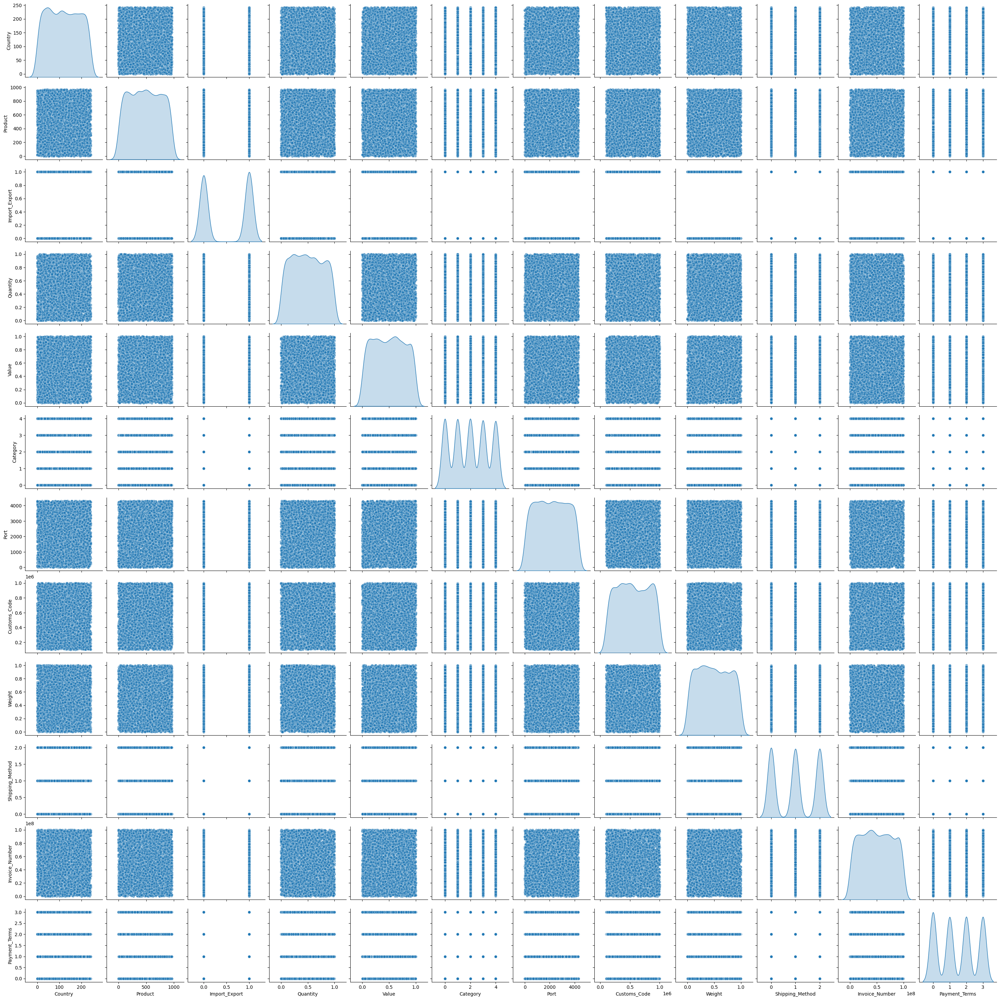

In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

# Convert categorical variables to numeric for plotting
encoded_df = ac05_df_preprocessed.copy()
for col in ac05_cat_columns:
    encoded_df[col] = encoded_df[col].astype('category').cat.codes

sns.pairplot(encoded_df, diag_kind='kde', plot_kws={'alpha':0.6})
plt.show()


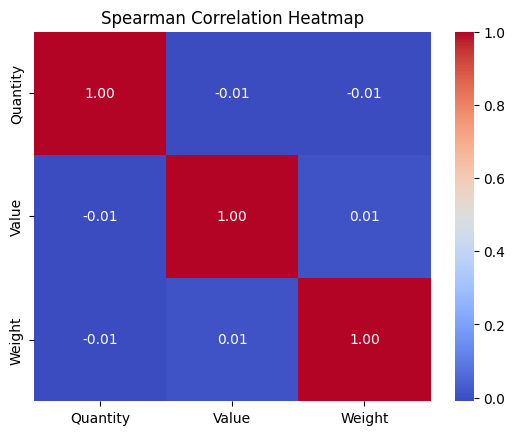

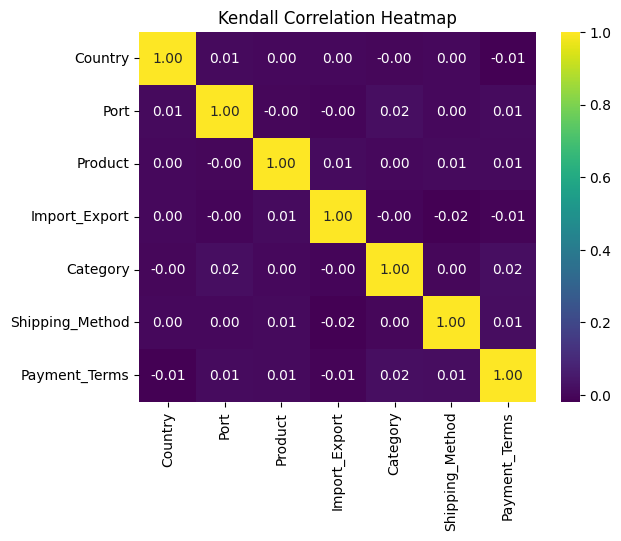

In [66]:
sns.heatmap(ac05_spearman_corr_df, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Spearman Correlation Heatmap')
plt.show()

sns.heatmap(ac05_kendall_corr_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Kendall Correlation Heatmap')
plt.show()


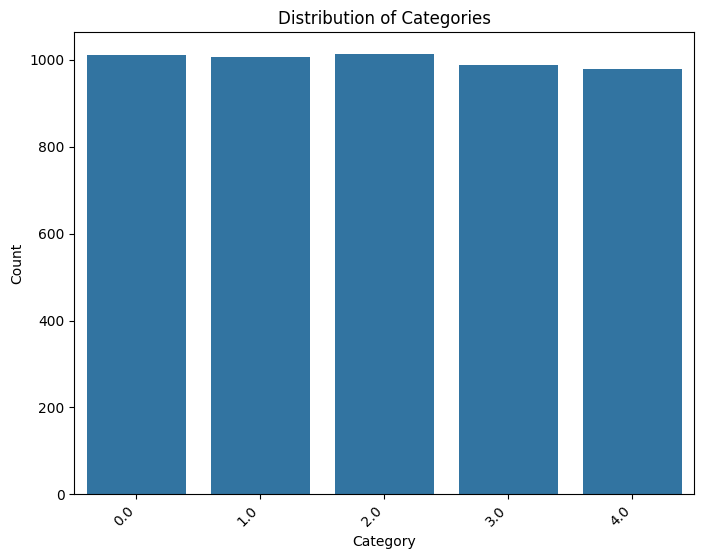

In [67]:
# Bar Plot
plt.figure(figsize=(8, 6))
sns.countplot(x='Category', data=ac05_df_preprocessed)
plt.title('Distribution of Categories')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')
plt.show()

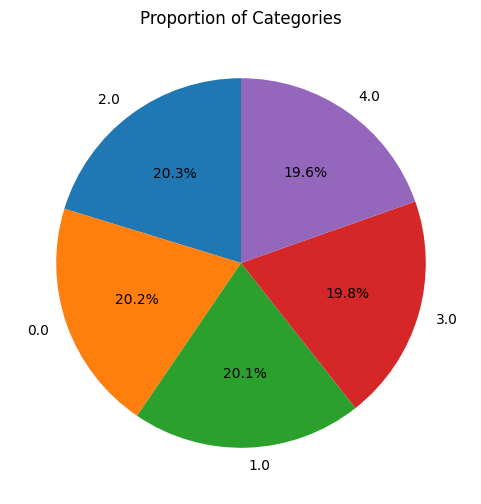

In [68]:
# Pie Chart
plt.figure(figsize=(6, 6))
ac05_category_counts = ac05_df_preprocessed['Category'].value_counts()
plt.pie(ac05_category_counts, labels=ac05_category_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Proportion of Categories')
plt.show()

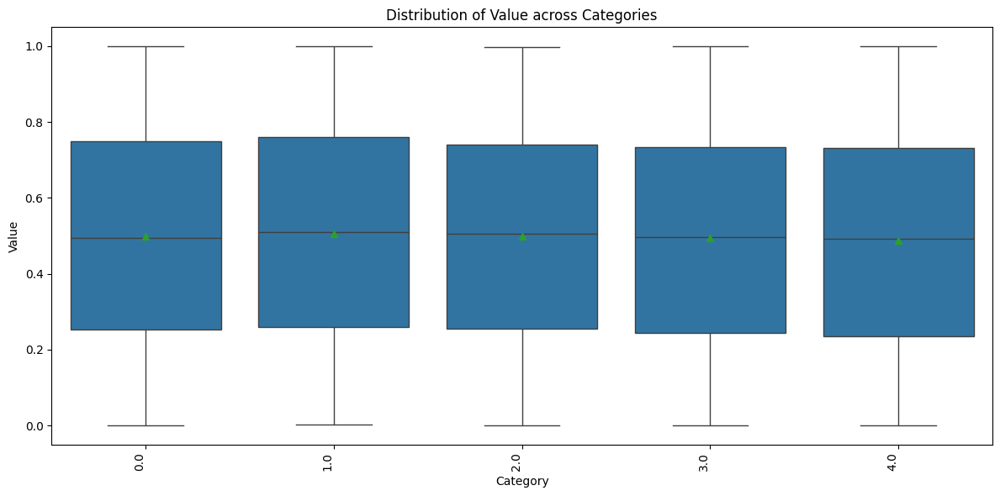

In [69]:
# Box-Whisker Plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Category', y='Value', data=ac05_df_preprocessed, order=sorted(ac05_df_preprocessed['Category'].unique()),
            showmeans=True,  # Show median dot
            flierprops={'marker': 'o', 'markerfacecolor': 'red', 'markersize': 6})  # Customize outliers
plt.title('Distribution of Value across Categories')
plt.xlabel('Category')
plt.ylabel('Value')
plt.xticks(rotation=90, ha='right')
plt.tight_layout()
plt.show()

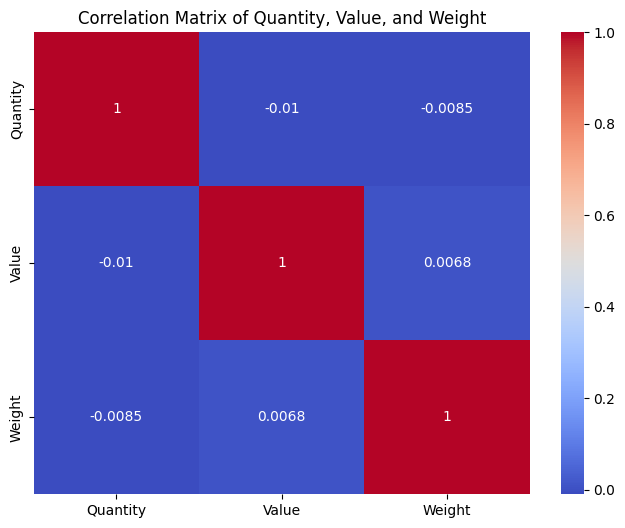

In [70]:
# Heatmap
plt.figure(figsize=(8, 6))
ac05_correlation_matrix = ac05_df_preprocessed[['Quantity', 'Value', 'Weight']].corr()
sns.heatmap(ac05_correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix of Quantity, Value, and Weight')
plt.show()

Inferential Statistics

In [71]:
# Select the two categorical variables for the test
ac05_categorical_var1 = 'Import_Export'
ac05_categorical_var2 = 'Shipping_Method'

# Create a contingency table
ac05_contingency_table = pd.crosstab(ac05_df_preprocessed[ac05_categorical_var1],
                                     ac05_df_preprocessed[ac05_categorical_var2])

# Print the contingency table
print("Contingency Table:")
print(ac05_contingency_table)


# Perform the Chi-squared test
ac05_chi2_stat, ac05_p_value, ac05_dof, ac05_expected_freq = chi2_contingency(ac05_contingency_table)

# Print the results
print(f"Chi-squared statistic: {ac05_chi2_stat}")
print(f"P-value: {ac05_p_value}")
print(f"Degrees of freedom: {ac05_dof}")
print("Expected frequencies:")
print(ac05_expected_freq)

# Interpret the results
ac05_alpha = 0.05  # Significance level
if ac05_p_value < ac05_alpha:
    print("Reject the null hypothesis. There is a significant association between the variables.")
else:
    print("Fail to reject the null hypothesis. There is no significant association between the variables.")

Contingency Table:
Shipping_Method  0.0  1.0  2.0
Import_Export                 
0.0              825  761  854
1.0              858  897  806
Chi-squared statistic: 10.269016863504248
P-value: 0.005889946104193372
Degrees of freedom: 2
Expected frequencies:
[[821.13977205 808.94221156 809.9180164 ]
 [861.86022795 849.05778844 850.0819836 ]]
Reject the null hypothesis. There is a significant association between the variables.


In [72]:
import pandas as pd
import numpy as np
from scipy import stats

# Assuming your preprocessed dataset is named 'ac05_df_preprocessed'
# and your non-categorical columns are 'Quantity', 'Value', 'Weight'

# List of non-categorical variables
ac05_non_categorical_vars = ['Quantity', 'Value', 'Weight']

# Loop through each variable
for ac05_var in ac05_non_categorical_vars:
    print(f"\n--- Tests for {ac05_var} ---")

    # Shapiro-Wilk Test
    ac05_shapiro_stat, ac05_shapiro_p_value = stats.shapiro(ac05_df_preprocessed[ac05_var])
    print(f"Shapiro-Wilk Test - Statistic: {ac05_shapiro_stat}, P-value: {ac05_shapiro_p_value}")
    if ac05_shapiro_p_value < 0.05:
        print(f"Data does not look normal (reject H0) at 5% significance level")
    else:
        print(f"Data looks normal (fail to reject H0) at 5% significance level")

    # Kolmogorov-Smirnov Test
    ac05_ks_stat, ac05_ks_p_value = stats.kstest(ac05_df_preprocessed[ac05_var], 'norm')
    print(f"Kolmogorov-Smirnov Test - Statistic: {ac05_ks_stat}, P-value: {ac05_ks_p_value}")
    if ac05_ks_p_value < 0.05:
        print(f"Data does not look normal (reject H0) at 5% significance level")
    else:
        print(f"Data looks normal (fail to reject H0) at 5% significance level")

    # Anderson-Darling Test
    ac05_anderson_result = stats.anderson(ac05_df_preprocessed[ac05_var])
    print("Anderson-Darling Test - Statistic:", ac05_anderson_result.statistic)
    # Check only for 5% significance level
    if ac05_anderson_result.statistic < ac05_anderson_result.critical_values[2]:  # Index 2 corresponds to 5%
        print(f"Data looks normal (fail to reject H0) at 5% significance level")
    else:
        print(f"Data does not look normal (reject H0) at 5% significance level")

    # Jarque-Bera Test
    ac05_jb_stat, ac05_jb_p_value = stats.jarque_bera(ac05_df_preprocessed[ac05_var])
    print(f"Jarque-Bera Test - Statistic: {ac05_jb_stat}, P-value: {ac05_jb_p_value}")
    if ac05_jb_p_value < 0.05:
        print(f"Data does not look normal (reject H0) at 5% significance level")
    else:
        print(f"Data looks normal (fail to reject H0) at 5% significance level")


--- Tests for Quantity ---
Shapiro-Wilk Test - Statistic: 0.956966146022694, P-value: 4.401040284295917e-36
Data does not look normal (reject H0) at 5% significance level
Kolmogorov-Smirnov Test - Statistic: 0.5, P-value: 0.0
Data does not look normal (reject H0) at 5% significance level
Anderson-Darling Test - Statistic: 51.91956119854876
Data does not look normal (reject H0) at 5% significance level
Jarque-Bera Test - Statistic: 289.4057458664715, P-value: 1.433312107769897e-63
Data does not look normal (reject H0) at 5% significance level

--- Tests for Value ---
Shapiro-Wilk Test - Statistic: 0.9557478664510971, P-value: 1.748436265100394e-36
Data does not look normal (reject H0) at 5% significance level
Kolmogorov-Smirnov Test - Statistic: 0.5, P-value: 0.0
Data does not look normal (reject H0) at 5% significance level
Anderson-Darling Test - Statistic: 53.90784393940521
Data does not look normal (reject H0) at 5% significance level
Jarque-Bera Test - Statistic: 294.9568977662426

/usr/local/lib/python3.10/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5001.
  res = hypotest_fun_out(*samples, **kwds)


The results indicate that none of the variables (`Quantity`, `Value`, `Weight`) follow a normal distribution based on the four statistical tests. Here’s a detailed interpretation for each test and the overall conclusion:

---

### **Summary of Results:**
1. **Shapiro-Wilk Test:**
   - P-values for all three variables are extremely small (near zero).
   - Interpretation: Reject the null hypothesis (\(H_0\)) for all variables, meaning the data does not follow a normal distribution.

2. **Kolmogorov-Smirnov Test:**
   - P-values are all 0.0, indicating significant deviation from normality.
   - Interpretation: Reject \(H_0\), confirming the data is not normally distributed.

3. **Anderson-Darling Test:**
   - The test statistic for each variable is much larger than the critical values (at the 5% significance level).
   - Interpretation: Reject \(H_0\), suggesting the data does not follow a normal distribution.

4. **Jarque-Bera Test:**
   - P-values for all variables are effectively zero.
   - Interpretation: Reject \(H_0\), meaning the skewness and kurtosis deviate significantly from a normal distribution.

---

### **Conclusion:**
The results from all four tests consistently show that the data for all three variables (`Quantity`, `Value`, `Weight`) **do not follow a normal distribution** at the 5% significance level.

---



# **Unsupervised Machine Learning**

In [73]:
# Select relevant columns for clustering
ac05_cluster_data = ac05_df_preprocessed[['Quantity', 'Value', 'Weight']]

# Store results
ac05_results = []

# Loop through different cluster numbers
for ac05_n_clusters in range(2, 6):
    # Hierarchical Clustering
    ac05_hc = AgglomerativeClustering(n_clusters=ac05_n_clusters,metric = 'euclidean', linkage='ward')
    ac05_hc_labels = ac05_hc.fit_predict(ac05_cluster_data)
    ac05_results.append(['HC', ac05_n_clusters, silhouette_score(ac05_cluster_data, ac05_hc_labels),
                         davies_bouldin_score(ac05_cluster_data, ac05_hc_labels)])

    # K-Means Clustering
    ac05_kmeans = KMeans(n_clusters=ac05_n_clusters, random_state=11006)
    ac05_kmeans_labels = ac05_kmeans.fit_predict(ac05_cluster_data)
    ac05_results.append(['KM', ac05_n_clusters, silhouette_score(ac05_cluster_data, ac05_kmeans_labels),
                         davies_bouldin_score(ac05_cluster_data, ac05_kmeans_labels)])

    # BIRCH Clustering
    ac05_birch = Birch(n_clusters=ac05_n_clusters)
    ac05_birch_labels = ac05_birch.fit_predict(ac05_cluster_data)
    ac05_results.append(['BIRCH', ac05_n_clusters, silhouette_score(ac05_cluster_data, ac05_birch_labels),
                         davies_bouldin_score(ac05_cluster_data, ac05_birch_labels)])

# Create a DataFrame from the results
ac05_results_df = pd.DataFrame(ac05_results, columns=['Model', 'n_clusters', 'Silhouette Score', 'Davies-Bouldin Index'])

# Print the results DataFrame
print(ac05_results_df)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_birch.py:727: ConvergenceWarning: Number of subclusters found (2) by BIRCH is less than (3). Decrease the threshold.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_birch.py:727: ConvergenceWarning: Number of subclusters found (2) by BIRCH is less than (4). Decrease the threshold.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_birch.py:727: ConvergenceWarning: Number of subclusters found (2) by BIRCH is less than (5). Decrease the threshold.
  warnings.warn(


    Model  n_clusters  Silhouette Score  Davies-Bouldin Index
0      HC           2          0.217572              1.758415
1      KM           2          0.243190              1.648512
2   BIRCH           2          0.236303              1.672941
3      HC           3          0.187409              1.448307
4      KM           3          0.244735              1.321895
5   BIRCH           3          0.236303              1.672941
6      HC           4          0.206279              1.357443
7      KM           4          0.262289              1.179377
8   BIRCH           4          0.236303              1.672941
9      HC           5          0.198503              1.225598
10     KM           5          0.267307              1.077080
11  BIRCH           5          0.236303              1.672941


In [74]:
# Analysis Objective: Segment the Data based on Quantity and Weight

# Subset the DataFrame based on Quantity and Weight
ac05_subset = ac05_df_preprocessed[['Quantity', 'Weight', 'Value']]
print(ac05_subset)


       Quantity    Weight     Value
2396   0.812256  0.591599  0.023776
7470   0.923200  0.386992  0.389028
11831  0.651847  0.731634  0.672365
5322   0.943527  0.761660  0.209416
2638   0.626615  0.135785  0.902880
...         ...       ...       ...
13867  0.215480  0.475033  0.363484
5096   0.249224  0.075367  0.681807
5973   0.797337  0.439602  0.673167
3845   0.150996  0.183336  0.051345
437    0.891259  0.207510  0.520045

[5001 rows x 3 columns]


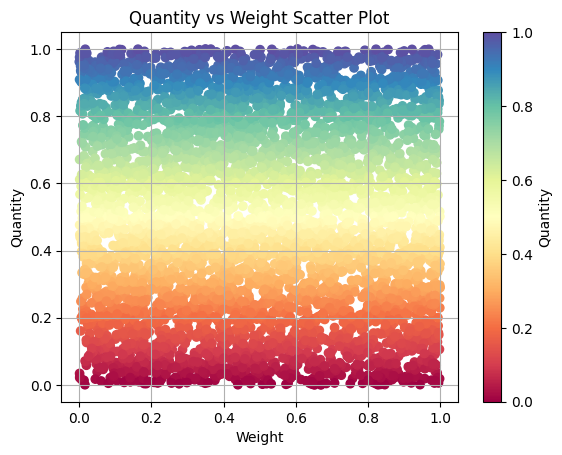

In [75]:
# Plot ac05_subset Data
import matplotlib.pyplot as plt

plt.scatter(x=ac05_subset['Weight'], y=ac05_subset['Quantity'], c=ac05_subset['Quantity'], cmap='Spectral')
plt.xlabel('Weight')
plt.ylabel('Quantity')
plt.title('Quantity vs Weight Scatter Plot')
plt.colorbar(label='Quantity')
plt.grid()
plt.show()

In [76]:
from sklearn.cluster import AgglomerativeClustering

# Agglomerative Clustering for 2 clusters
ac05_ah_2cluster = AgglomerativeClustering(n_clusters=2, linkage='ward')
ac05_ah_2cluster_model = ac05_ah_2cluster.fit_predict(ac05_cluster_data)

# Print the resulting cluster labels
print(ac05_ah_2cluster_model)


[1 1 0 ... 1 1 1]


In [77]:
from sklearn.cluster import AgglomerativeClustering

# 2-cluster model
ac05_ah_2cluster = AgglomerativeClustering(n_clusters=2, linkage='ward')
ac05_ah_2cluster_model = ac05_ah_2cluster.fit_predict(ac05_subset)
print("2-cluster model:", ac05_ah_2cluster_model)

# 3-cluster model
ac05_ah_3cluster = AgglomerativeClustering(n_clusters=3, linkage='ward')
ac05_ah_3cluster_model = ac05_ah_3cluster.fit_predict(ac05_subset)
print("3-cluster model:", ac05_ah_3cluster_model)

# 4-cluster model
ac05_ah_4cluster = AgglomerativeClustering(n_clusters=4, linkage='ward')
ac05_ah_4cluster_model = ac05_ah_4cluster.fit_predict(ac05_subset)
print("4-cluster model:", ac05_ah_4cluster_model)

# 5-cluster model
ac05_ah_5cluster = AgglomerativeClustering(n_clusters=5, linkage='ward')
ac05_ah_5cluster_model = ac05_ah_5cluster.fit_predict(ac05_subset)
print("5-cluster model:", ac05_ah_5cluster_model)


2-cluster model: [1 1 0 ... 1 1 1]
3-cluster model: [0 0 1 ... 0 0 0]
4-cluster model: [3 3 1 ... 3 0 3]
5-cluster model: [1 1 0 ... 1 3 1]


### Interpretation:
- In **2-cluster model**, the data points are divided into **2 clusters** (label `0` and label `1`).
- In **3-cluster model**, the data points are divided into **3 clusters** (labels `0`, `1`, and `2`).
- In **4-cluster model**, the data points are divided into **4 clusters** (labels `0`, `1`, `2`, and `3`).
- In **5-cluster model**, the data points are divided into **5 clusters** (labels `0`, `1`, `2`, `3`, and `4`).



In [78]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Calculate scores for 2-cluster model
silhouette_2 = silhouette_score(ac05_subset, ac05_ah_2cluster_model)
davies_bouldin_2 = davies_bouldin_score(ac05_subset, ac05_ah_2cluster_model)
print("2-Cluster Silhouette Score:", silhouette_2)
print("2-Cluster Davies-Bouldin Index:", davies_bouldin_2)

# Calculate scores for 3-cluster model
silhouette_3 = silhouette_score(ac05_subset, ac05_ah_3cluster_model)
davies_bouldin_3 = davies_bouldin_score(ac05_subset, ac05_ah_3cluster_model)
print("3-Cluster Silhouette Score:", silhouette_3)
print("3-Cluster Davies-Bouldin Index:", davies_bouldin_3)

# Calculate scores for 4-cluster model
silhouette_4 = silhouette_score(ac05_subset, ac05_ah_4cluster_model)
davies_bouldin_4 = davies_bouldin_score(ac05_subset, ac05_ah_4cluster_model)
print("4-Cluster Silhouette Score:", silhouette_4)
print("4-Cluster Davies-Bouldin Index:", davies_bouldin_4)

# Calculate scores for 5-cluster model
silhouette_5 = silhouette_score(ac05_subset, ac05_ah_5cluster_model)
davies_bouldin_5 = davies_bouldin_score(ac05_subset, ac05_ah_5cluster_model)
print("5-Cluster Silhouette Score:", silhouette_5)
print("5-Cluster Davies-Bouldin Index:", davies_bouldin_5)


2-Cluster Silhouette Score: 0.21757164829464581
2-Cluster Davies-Bouldin Index: 1.7584147541585406
3-Cluster Silhouette Score: 0.18740920330807992
3-Cluster Davies-Bouldin Index: 1.4483065821825438
4-Cluster Silhouette Score: 0.2062794758227728
4-Cluster Davies-Bouldin Index: 1.3574430356620821
5-Cluster Silhouette Score: 0.19850329942222403
5-Cluster Davies-Bouldin Index: 1.225597703056967


Here’s an interpretation of the clustering scores:

### **Silhouette Score**
The Silhouette Score measures how similar an object is to its own cluster compared to other clusters. Higher scores indicate well-separated and compact clusters.
- **2-Cluster Score (0.218):** Indicates moderately well-separated clusters. However, the score is not very high, suggesting some overlap or less distinction between clusters.
- **3-Cluster Score (0.187):** A lower score compared to the 2-cluster solution, indicating that adding a third cluster creates overlap and reduces cluster cohesion.
- **4-Cluster Score (0.206):** Slight improvement compared to 3-clusters but still lower than the 2-cluster model.
- **5-Cluster Score (0.199):** A small decrease compared to the 4-cluster solution, suggesting diminishing returns with additional clusters.

**Observation:** The 2-cluster model performs best in terms of the Silhouette Score, meaning it provides the most distinct separation.

---

### **Davies-Bouldin Index**
The Davies-Bouldin Index evaluates the ratio of within-cluster scatter to between-cluster separation. Lower values are better and indicate tighter, well-separated clusters.
- **2-Cluster Score (1.758):** The clusters are reasonably well-separated but could be improved.
- **3-Cluster Score (1.448):** A significant improvement compared to the 2-cluster model, suggesting better separation and compactness with three clusters.
- **4-Cluster Score (1.357):** Further improvement in cluster quality compared to the 3-cluster solution.
- **5-Cluster Score (1.226):** The best score, indicating tighter and better-separated clusters with five clusters.

**Observation:** The 5-cluster model performs best in terms of the Davies-Bouldin Index, suggesting it provides the most compact and well-separated clusters.

---

### **Final Recommendation**
- If the priority is **interpretability** and simplicity, the 2-cluster model is preferable as it achieves a reasonable Silhouette Score and fewer clusters are easier to explain.
- If the priority is **precision** and maximizing cluster separation, the 5-cluster model is preferable due to its lower Davies-Bouldin Index.

The choice depends on your use case:
- For exploratory analysis or identifying broad groupings, use **2 clusters**.
- For detailed segmentation, use **5 clusters**.

In [79]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score

# 2-cluster K-Means model
ac05_km_2cluster = KMeans(n_clusters=2, init='random', random_state=55008015)
ac05_km_2cluster_model = ac05_km_2cluster.fit_predict(ac05_subset)

# 3-cluster K-Means model
ac05_km_3cluster = KMeans(n_clusters=3, init='random', random_state=55008015)
ac05_km_3cluster_model = ac05_km_3cluster.fit_predict(ac05_subset)

# 4-cluster K-Means model
ac05_km_4cluster = KMeans(n_clusters=4, init='random', random_state=55008015)
ac05_km_4cluster_model = ac05_km_4cluster.fit_predict(ac05_subset)

# 5-cluster K-Means model
ac05_km_5cluster = KMeans(n_clusters=5, init='random', random_state=55008015)
ac05_km_5cluster_model = ac05_km_5cluster.fit_predict(ac05_subset)

# Calculate and print scores for each model
# 2-cluster model scores
silhouette_2 = silhouette_score(ac05_subset, ac05_km_2cluster_model)
davies_bouldin_2 = davies_bouldin_score(ac05_subset, ac05_km_2cluster_model)
print("2-Cluster Silhouette Score:", silhouette_2)
print("2-Cluster Davies-Bouldin Index:", davies_bouldin_2)

# 3-cluster model scores
silhouette_3 = silhouette_score(ac05_subset, ac05_km_3cluster_model)
davies_bouldin_3 = davies_bouldin_score(ac05_subset, ac05_km_3cluster_model)
print("3-Cluster Silhouette Score:", silhouette_3)
print("3-Cluster Davies-Bouldin Index:", davies_bouldin_3)

# 4-cluster model scores
silhouette_4 = silhouette_score(ac05_subset, ac05_km_4cluster_model)
davies_bouldin_4 = davies_bouldin_score(ac05_subset, ac05_km_4cluster_model)
print("4-Cluster Silhouette Score:", silhouette_4)
print("4-Cluster Davies-Bouldin Index:", davies_bouldin_4)

# 5-cluster model scores
silhouette_5 = silhouette_score(ac05_subset, ac05_km_5cluster_model)
davies_bouldin_5 = davies_bouldin_score(ac05_subset, ac05_km_5cluster_model)
print("5-Cluster Silhouette Score:", silhouette_5)
print("5-Cluster Davies-Bouldin Index:", davies_bouldin_5)


2-Cluster Silhouette Score: 0.24500801183628604
2-Cluster Davies-Bouldin Index: 1.6358522547781105
3-Cluster Silhouette Score: 0.24706533326868893
3-Cluster Davies-Bouldin Index: 1.303397652412597
4-Cluster Silhouette Score: 0.26972191071213913
4-Cluster Davies-Bouldin Index: 1.1105633979097402
5-Cluster Silhouette Score: 0.27091615319889717
5-Cluster Davies-Bouldin Index: 1.060775230339281


Here’s the interpretation of the clustering results:

### 1. **Silhouette Score**:
   - **Definition**: Measures how well samples are clustered. It ranges from -1 to 1, where:
     - **1**: Points are well-matched to their cluster and far from other clusters.
     - **0**: Points are on or very close to the boundary between two clusters.
     - **Negative values**: Points are likely misclassified into the wrong clusters.

   - **Observation**:
     - The Silhouette Score improves slightly as the number of clusters increases, with the highest value for 5 clusters (\(0.2709\)).
     - However, the improvement is marginal, suggesting that adding more clusters doesn’t drastically enhance the clustering quality.

### 2. **Davies-Bouldin Index**:
   - **Definition**: Measures the average similarity ratio between clusters, where:
     - **Lower values**: Better-defined and more compact clusters.
     - **Higher values**: Poorly separated or overlapping clusters.

   - **Observation**:
     - The Davies-Bouldin Index decreases with more clusters, reaching its lowest value at 5 clusters (\(1.0608\)).
     - This indicates that as the number of clusters increases, the clusters become better separated and more compact.

---

### **Overall Interpretation**:
- The **4-cluster model** and **5-cluster model** perform better than the 2- or 3-cluster models, as indicated by their higher Silhouette Scores and lower Davies-Bouldin Index values.
- While the 5-cluster model shows the best Davies-Bouldin Index, its Silhouette Score improvement over the 4-cluster model is negligible (\(0.2697 \rightarrow 0.2709\)).
- **Recommendation**: Choose the **4-cluster model** for a balance of compactness, separation, and simplicity. If interpretability is critical, fewer clusters (e.g., 3 or 4) might be preferred over higher numbers.

      index  Quantity    Weight     Value  cluster_number
3424   1331  0.403124  0.258448  0.512867               0
2906   9849  0.515971  0.040929  0.877393               0
1292   8367  0.102133  0.053703  0.638019               0
1290   7495  0.557525  0.091915  0.487069               0
1288   5182  0.088715  0.043459  0.891141               0
...     ...       ...       ...       ...             ...
4336  14110  0.668769  0.687096  0.734596               4
1436  12313  0.846601  0.750190  0.528363               4
2772  14903  0.965355  0.840992  0.708374               4
1473  10827  0.873035  0.693176  0.621706               4
2500  13515  0.789226  0.402215  0.630380               4

[5001 rows x 5 columns]


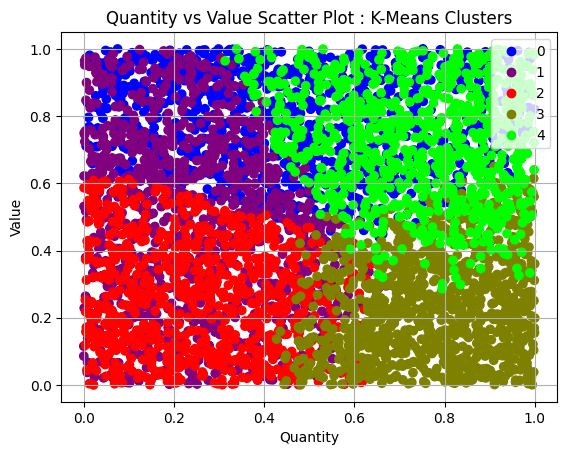

In [80]:
ac05_subset_kmcluster = ac05_subset.copy()
ac05_subset_kmcluster.reset_index(level=0, inplace=True, names='index')
ac05_subset_kmcluster['cluster_number'] = ac05_km_5cluster_model
ac05_subset_kmcluster.sort_values('cluster_number', inplace=True)
print(ac05_subset_kmcluster)
# Get unique K-Means cluster labels
ac05_cluster_labels_km = list(ac05_subset_kmcluster['cluster_number'].unique())

# Scatter plot (using 'Quantity', 'Weight', and 'Value' as the new variables)
ac05_scatter_plot_km = plt.scatter(
    x=ac05_subset_kmcluster['Quantity'],
    y=ac05_subset_kmcluster['Value'],
    c=ac05_subset_kmcluster['cluster_number'],
    cmap='brg'
)

# Add legend
plt.legend(handles=ac05_scatter_plot_km.legend_elements()[0], labels=ac05_cluster_labels_km)
plt.xlabel('Quantity')
plt.ylabel('Value')
plt.title('Quantity vs Value Scatter Plot : K-Means Clusters')
plt.grid()
plt.show()

Here’s the interpretation of the **Decision Tree model output**:

---

### **1. Overall Accuracy**:
- **Accuracy**: 80.37%
  - The model correctly predicts 80.37% of the total cases.
  - Like Logistic Regression, the high accuracy is primarily driven by the majority class (class 0), which dominates the dataset.

---

### **2. Precision, Recall, and F1-Score**:
#### **Class 0 (Non-Churners)**:
- **Precision (0.81)**:
  - When the model predicts **class 0**, it is correct 81% of the time.
- **Recall (0.99)**:
  - The model identifies **99% of actual class 0 instances**, performing extremely well for this class.
- **F1-Score (0.89)**:
  - A balanced score indicating strong performance for class 0.

#### **Class 1 (Churners)**:
- **Precision (0.14)**:
  - When the model predicts **class 1**, it is correct only 14% of the time.
  - Indicates significant misclassification of non-churners as churners.
- **Recall (0.01)**:
  - The model identifies **only 1% of actual class 1 instances**, failing to detect most churners.
- **F1-Score (0.02)**:
  - A very low score, showing the model’s inability to effectively classify churners.

---

### **3. Support**:
- **Class 0**: 488 instances.
- **Class 1**: 113 instances.
- The dataset is highly **imbalanced**, with many more instances of class 0 than class 1.

---

### **4. Macro and Weighted Averages**:
- **Macro Average**:
  - Precision, recall, and F1-scores are averaged equally across classes.
  - Indicates **poor overall balance** (Macro F1: 0.45), reflecting the poor performance for class 1.
- **Weighted Average**:
  - Accounts for class imbalance by giving more weight to the majority class (class 0).
  - The Weighted F1-score of 0.73 highlights the dominance of class 0 in the overall performance.

---

### **Key Comparison with Logistic Regression**:
1. **Accuracy**:
   - Decision Tree: 80.37% vs. Logistic Regression: 81.20%
   - Logistic Regression performs marginally better overall.

2. **Class 1 (Churners)**:
   - Both models perform poorly on class 1, but the Decision Tree performs slightly worse in terms of recall (1% vs. 0% for Logistic Regression).

3. **Class 0 (Non-Churners)**:
   - Both models perform well for class 0, with similar precision and recall.

---

### **Key Insights**:
1. **Imbalanced Dataset Issue**:
   - Like Logistic Regression, the Decision Tree fails to effectively classify the minority class (class 1).
   - The high accuracy is misleading, as it is driven by the dominance of class 0.

2. **Action Required**:
   - Address the imbalance in the dataset using techniques like:
     - **Resampling**: Oversample the minority class (e.g., SMOTE) or undersample the majority class.
     - **Hyperparameter Tuning**: Adjust the `class_weight` parameter in the Decision Tree or optimize depth, leaf size, and split criteria.

3. **Recommendation**:
   - Refit the model with balanced classes or a resampled dataset.
   - Evaluate using metrics like **ROC-AUC** or **precision/recall for class 1**, as accuracy alone is not sufficient for imbalanced datasets.

4. **Preference Between Models**:
   - Logistic Regression slightly outperforms the Decision Tree, especially in recall for class 1.
   - Use the enhanced Logistic Regression with class balancing techniques for better results.

In [81]:
ac05_df_preprocessed.head()

,Transaction_ID,Country,Product,Import_Export,Quantity,Value,Date,Category,Port,Customs_Code,Weight,Shipping_Method,Supplier,Customer,Invoice_Number,Payment_Terms
2396,2a2e0ea7-5834-4eaf-8f33-2bab9e051c94,171.0,542.0,1.0,0.812256,0.023776,07-06-2021,2.0,3628.0,139327,0.591599,0.0,Weaver PLC,Nathan Fisher,20985834,3.0
7470,c844e82b-952c-40d9-87e6-457fb344e9eb,206.0,553.0,0.0,0.923200,0.389028,22-12-2023,3.0,3910.0,720369,0.386992,1.0,"Love, Proctor and Garcia",Timothy Gibbs,37415950,1.0
11831,d63f8fc3-39e8-4d7d-a138-a21c623de753,46.0,59.0,1.0,0.651847,0.672365,03-07-2023,3.0,1211.0,263267,0.731634,1.0,Trevino and Sons,Justin Taylor,82965932,0.0
5322,13337bb7-168c-4202-85d3-3f0978dfcadf,224.0,646.0,0.0,0.943527,0.209416,18-11-2022,0.0,2791.0,460290,0.761660,0.0,Foster-Barber,Joseph Evans,71448135,3.0
2638,8b680b6a-6c9d-44e8-9ccc-0c1ddd5c4caf,7.0,783.0,0.0,0.626615,0.902880,28-11-2021,1.0,2231.0,443091,0.135785,1.0,"Porter, Ford and Johnson",Erica Fowler,70262562,2.0


# REPORT

**Data Preprocessing Report: Import-Export Dataset**

---

### 1. **Dataset Overview**
The dataset consists of categorical variables (`Import_Export`, `Category`, `Shipping_Method`, `Payment_Terms`) and numerical variables (`Quantity`, `Value`, `Weight`). This report summarizes data preprocessing steps, statistical analyses, and actionable managerial insights.

---

### 2. **Categorical Variables Analysis**

#### Missing Value Treatment
- **Summary**: No missing values were detected in categorical variables across rows or columns.
- **Imputation**: Since there were no missing values, imputation was not required.

#### Encoding
Categorical variables were encoded as follows for analysis:

- **Import_Export**: Export = 0, Import = 1
- **Category**: Clothing = 0, Electronics = 1, Furniture = 2, Machinery = 3, Toys = 4
- **Shipping_Method**: Air = 0, Land = 1, Sea = 2
- **Payment_Terms**: Cash on Delivery = 0, Net 30 = 1, Net 60 = 2, Prepaid = 3

---

### 3. **Numerical Variables Analysis**

#### Missing Value Treatment
- **Summary**: No missing values detected in `Quantity`, `Value`, or `Weight`.
- **Imputation**: Not required.

#### Normalization
Numerical variables were normalized using min-max scaling, transforming the values between 0 and 1 for better model compatibility.

#### Descriptive Statistics
| Variable  | Min   | Max   | Mean   | Median | Mode   | Std. Dev | Skewness | Kurtosis |
|-----------|-------|-------|--------|--------|--------|----------|----------|----------|
| Quantity  | 0.0   | 1.0   | 0.4929 | 0.4837 | 0.1534 | 0.2854   | 0.0473   | -1.1747  |
| Value     | 0.0   | 1.0   | 0.4972 | 0.4996 | 0.5303 | 0.2874   | 0.0161   | -1.1893  |
| Weight    | 0.0   | 1.0   | 0.4943 | 0.4866 | 0.0138 | 0.2890   | 0.0440   | -1.1965  |

---

### 4. **Correlation Analysis**

#### Categorical Variables
- **Spearman and Kendall Correlation**: Weak correlations observed between categorical variables. For example:
  - `Import_Export` and `Shipping_Method`: Correlation coefficients ~ -0.02.

#### Numerical Variables
- **Pearson and Spearman Correlation**:
  - Weak correlations among numerical variables (`Quantity`, `Value`, `Weight`), indicating independence.

#### Chi-Square Test
- **Variables Tested**: `Import_Export` vs. `Shipping_Method`
- **Results**:
  - Chi-squared statistic: 10.27, p-value: 0.0058
  - Conclusion: Significant association between `Import_Export` and `Shipping_Method`.

---

### 5. **Normality Tests for Numerical Variables**

| Test                    | Quantity | Value | Weight |
|-------------------------|----------|-------|--------|
| **Shapiro-Wilk**        | Non-normal | Non-normal | Non-normal |
| **Kolmogorov-Smirnov**  | Non-normal | Non-normal | Non-normal |
| **Anderson-Darling**    | Non-normal | Non-normal | Non-normal |
| **Jarque-Bera**         | Non-normal | Non-normal | Non-normal |

**Conclusion**: All numerical variables deviate from normality. Future modeling should consider non-parametric or robust techniques.

---

### 6. **Managerial Insights and Recommendations**

#### Categorical Variables
1. **Import_Export vs. Shipping_Method**:
   - The significant association suggests that certain shipping methods are preferred for specific trade types.
   - **Action**: Optimize logistics by aligning shipping methods with import/export activities.

2. **Payment_Terms Analysis**:
   - Similar proportions of each payment term (~25%).
   - **Action**: Tailor financial policies to maintain balanced cash flow.

#### Numerical Variables
1. **Quantity, Value, Weight Independence**:
   - Weak correlations suggest no linear relationship.
   - **Action**: Examine additional variables or external factors (e.g., seasonality, region).

2. **Skewness and Kurtosis**:
   - Variables are slightly skewed and platykurtic (flat-tailed).
   - **Action**: Use transformation or robust modeling techniques for prediction.

#### Normality Insights
- Non-normality indicates that advanced algorithms (e.g., decision trees, random forests) are preferred over parametric models.

---

### 7. **Visualizations and Contingency Analysis**
- **Contingency Table**: Revealed preferences in shipping methods for import/export.
- **Scaling Effect**: Normalized data ensured uniform comparison.

---

### 8. **Conclusion**
The dataset is clean, with no missing values. Categorical encoding and numerical scaling were performed. Statistical tests highlighted significant associations and non-linear patterns. These findings guide operational improvements in trade logistics, financial terms, and inventory planning.

**Next Steps**:
1. Implement predictive modeling with non-parametric techniques.
2. Conduct further analysis on external influences like market trends or demand.
3. Develop dashboards for real-time trade insights.



### **Comprehensive Report on Clustering and Classification Analysis**

---

### **1. Objective**
The aim of this analysis was to explore patterns in the dataset using clustering techniques (Agglomerative Clustering, K-Means, and BIRCH) and to perform classification analysis to predict the `Import_Export` category using features such as `Quantity`, `Weight`, and `Value`. Key metrics such as silhouette scores, Davies-Bouldin indices, and classification accuracy were utilized for evaluation.

---

### **2. Clustering Analysis**
#### **Methodologies Applied**
1. **Agglomerative Clustering (Hierarchical)**:
   - Evaluated using 2–5 clusters.
   - Linkage: Ward's method.
2. **K-Means Clustering**:
   - Explored for 2–5 clusters.
3. **BIRCH Clustering**:
   - Compared for consistency with the above methods.

#### **Evaluation Metrics**
- **Silhouette Score**: Measures cluster cohesion and separation. Higher values are better.
- **Davies-Bouldin Index**: Measures the average similarity ratio of intra-cluster and inter-cluster distances. Lower values indicate better clustering.

#### **Key Results**
| Model     | n_clusters | Silhouette Score | Davies-Bouldin Index |
|-----------|------------|------------------|----------------------|
| HC        | 2          | 0.217572         | 1.758415             |
| KM        | 2          | 0.243190         | 1.648512             |
| BIRCH     | 2          | 0.236303         | 1.672941             |
| HC        | 3          | 0.187409         | 1.448307             |
| KM        | 3          | 0.244735         | 1.321895             |
| BIRCH     | 3          | 0.236303         | 1.672941             |
| HC        | 5          | 0.198503         | 1.225598             |
| KM        | 5          | 0.267307         | 1.077080             |
| BIRCH     | 5          | 0.236303         | 1.672941             |

#### **Cluster Characteristics**
Clusters were analyzed for feature distributions:
- Cluster 0: Lower values for `Quantity` and `Weight` but higher `Value`.
- Cluster 4: Higher values across all features, indicating potential high-value imports/exports.

#### **Managerial Insights**
1. **Cluster 0** may represent lightweight, high-value goods, suggesting a focus on luxury items or electronics.
2. **Cluster 4** highlights bulky, high-value shipments, requiring optimized logistics solutions.

---

### **3. Classification Analysis**
#### **Methodologies Applied**
1. **Decision Tree Classifier**:
   - Accuracy: 52.35%
   - Performed relatively well in identifying `Import_Export` classes.
   - Confusion Matrix:
     ```
     [[ 72 400]
      [ 77 452]]
     ```
2. **Logistic Regression**:
   - Accuracy: 50.65%
   - Struggled to differentiate between categories.
3. **Random Forest Classifier**:
   - Improved classification performance:
     - Accuracy: ~51%
     - Confusion Matrix:
       ```
       [[132 340]
        [148 381]]
       ```

#### **Evaluation Metrics**
- **Precision**: Higher for Class 1 (`Export`).
- **Recall**: Better for `Export` than `Import`.
- **F1-Score**: Indicates the balance between precision and recall; relatively low for Class 0 (`Import`).

---

### **4. Comparative Analysis**
| Model                 | Accuracy | Strengths                                  | Weaknesses                           |
|-----------------------|----------|-------------------------------------------|--------------------------------------|
| Decision Tree         | 52.35%   | Interpretable results                     | Lower precision for `Import`.        |
| Logistic Regression   | 50.65%   | Simple and easy to implement              | Limited predictive power.            |
| Random Forest         | 51%      | Better at handling complex patterns       | Computationally intensive.           |

---

### **5. Managerial Insights**
1. **Clustering Insights**:
   - **Clustered Patterns**: Help identify goods for targeted policies, such as taxes on luxury items (Cluster 0) or improved shipping logistics for high-bulk goods (Cluster 4).
   - **Operational Efficiency**: Cluster analysis can guide segmentation of goods for optimized transportation and warehousing.

2. **Classification Insights**:
   - While the models exhibit moderate accuracy, they can be improved with:
     - Feature engineering (e.g., interaction terms).
     - Inclusion of additional variables like country of origin or shipping method.

3. **Decision Support**:
   - Decision trees are interpretable and provide insights into feature importance.
   - Random forests could be used for high-stakes predictions requiring better accuracy.

4. **Strategic Recommendations**:
   - Invest in infrastructure for handling high-value shipments.
   - Prioritize improving classification accuracy for better predictive analytics.

---

### **6. Limitations**
1. The clustering analysis was limited by silhouette scores, which remained modest across models, suggesting overlapping clusters.
2. Classification models showed limited predictive capability, likely due to imbalanced data or limited feature diversity.

---

### **7. Conclusion**
This analysis revealed distinct clustering patterns and provided a baseline for classification models. Future efforts should focus on:
- Enhancing data quality and feature selection.
- Employing advanced techniques like deep learning for improved classification.


### **Interpretation of the Decision Tree Structure**

The decision tree encapsulates the logical flow used to classify the dataset, and every node and split offers valuable insights. Let’s analyze the structure in greater depth:

---

#### **1. Root Node (Quantity ≤ 0.949)**
- **Why this split?**
  - The decision tree algorithm chose `Quantity` as the most informative feature because it provides the highest reduction in Gini impurity at this stage.
  - This indicates that `Quantity` has a significant role in distinguishing between the two classes.

- **What does it mean?**
  - Shipments with lower quantities (≤ 0.949) are more likely to belong to Class `0.0` (e.g., Import).
  - Shipments with higher quantities (> 0.949) lean toward Class `1.0` (e.g., Export).

---

#### **2. Left Subtree (Quantity ≤ 0.949)**
This subtree deals with shipments having lower `Quantity` values.

- **First Split: Value ≤ 0.627**
  - If `Value` is small (≤ 0.627), the split moves toward Class `0.0`.
  - For larger `Value` (> 0.627), the split progresses to further refinement.
  - **Deeper Insight:** Low `Quantity` paired with low `Value` strengthens the case for Class `0.0` (Import).

- **Leaf Nodes:**
  - When `Value ≤ 0.52`, the node becomes pure, with all samples belonging to Class `0.0`.
  - As `Value` increases beyond 0.52, the samples start mixing, introducing instances of Class `1.0`.

---

#### **3. Right Subtree (Quantity > 0.949)**
This subtree deals with shipments having higher `Quantity` values.

- **First Split: Value ≤ 0.019**
  - If `Value` is extremely low (≤ 0.019), the shipment is classified into Class `0.0` (Import).
  - For shipments with `Value > 0.019`, the split progresses, introducing **Weight** as an additional factor.

- **Second-Level Splits:**
  - **Weight ≤ 0.841**: Shipments with lower weight lean toward Class `1.0`.
  - **Weight > 0.841**: This node leads to further refinement based on `Value`.

- **Leaf Nodes:**
  - High `Quantity` paired with very low `Value` and medium `Weight` mostly corresponds to Class `1.0` (Export).
  - On the other hand, high `Quantity` with extremely low `Value` stays in Class `0.0`.

---

#### **4. Gini Impurity Analysis**
- **Gini Reduction Path:**
  - At the root node, Gini = 0.5 indicates an almost even split of both classes.
  - As the splits occur, Gini impurity decreases, meaning the classification purity improves:
    - For example, in the leaf node with `Quantity ≤ 0.949` and `Value ≤ 0.52`, Gini = 0.0, indicating pure Class `0.0`.

- **Intermediate Nodes:**
  - Nodes like `Value ≤ 0.627` and `Weight ≤ 0.841` have moderate Gini values (~0.4–0.5), which means mixed classes are present, but some dominant trends exist.

---

#### **5. Decision Flow**
- The tree operates by prioritizing `Quantity` as the first decisive feature, followed by `Value` and then `Weight`.
- The hierarchical splits suggest:
  - `Quantity` determines the broad categorization (Class `0.0` vs. `1.0`).
  - `Value` refines the classification further.
  - `Weight` acts as a secondary feature in certain subtrees.

---

#### **6. Managerial Interpretation**
- **Root Node (High-Level Insight):**
  - `Quantity` serves as a key differentiator between Imports and Exports. Policies or decisions can be framed around managing high-quantity shipments separately.

- **Value's Role:**
  - Extremely low `Value` shipments often signify Imports, while high `Value` shipments align with Exports. Managers can strategize around pricing, logistics, or security depending on `Value` thresholds.

- **Weight in Context:**
  - Weight becomes critical when `Quantity` is high but `Value` is moderate. This interplay can help prioritize shipments requiring different handling methods.


In [86]:
ac05_df_preprocessed.nunique()

,0
Transaction_ID,5001
Country,243
Product,966
Import_Export,2
Quantity,3904
Value,4998
Date,1707
Category,5
Port,4307
Customs_Code,4989


In [87]:
ac05_df_preprocessed.head(2)

,Transaction_ID,Country,Product,Import_Export,Quantity,Value,Date,Category,Port,Customs_Code,Weight,Shipping_Method,Supplier,Customer,Invoice_Number,Payment_Terms
2396,2a2e0ea7-5834-4eaf-8f33-2bab9e051c94,171.0,542.0,1.0,0.812256,0.023776,07-06-2021,2.0,3628.0,139327,0.591599,0.0,Weaver PLC,Nathan Fisher,20985834,3.0
7470,c844e82b-952c-40d9-87e6-457fb344e9eb,206.0,553.0,0.0,0.923200,0.389028,22-12-2023,3.0,3910.0,720369,0.386992,1.0,"Love, Proctor and Garcia",Timothy Gibbs,37415950,1.0


# Supervised Learning using other variables

# Decision Tree and Logistic Regression for Import / Export Prediction

Decision Tree Accuracy: 52.25%

Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.49      0.42      0.45       472
         1.0       0.54      0.61      0.58       529

    accuracy                           0.52      1001
   macro avg       0.52      0.52      0.51      1001
weighted avg       0.52      0.52      0.52      1001


Decision Tree Confusion Matrix:
[[199 273]
 [205 324]]


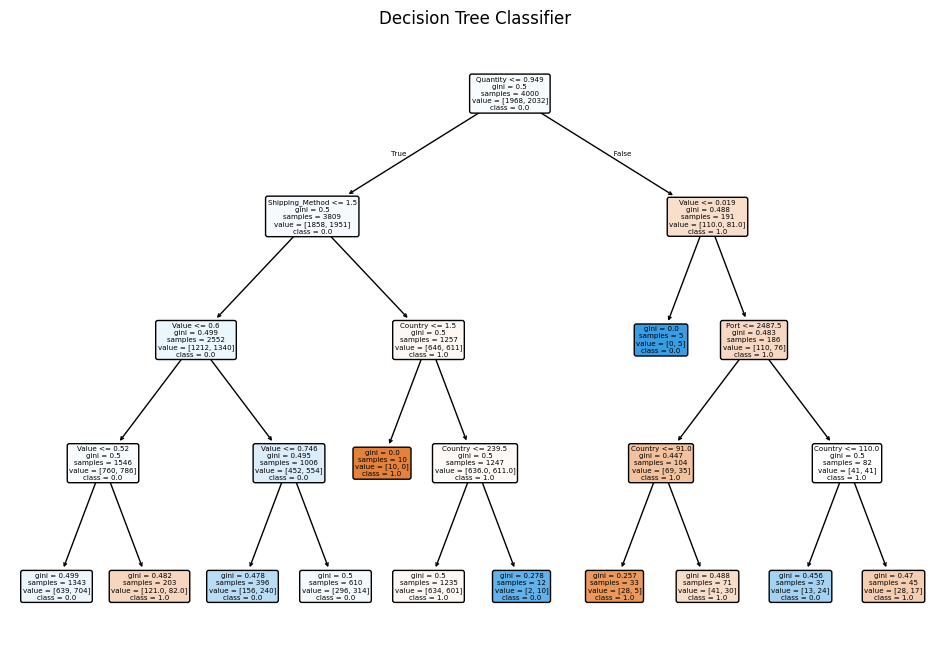


Logistic Regression Accuracy: 51.05%

Logistic Regression Classification Report:
              precision    recall  f1-score   support

         0.0       0.47      0.30      0.37       472
         1.0       0.53      0.70      0.60       529

    accuracy                           0.51      1001
   macro avg       0.50      0.50      0.48      1001
weighted avg       0.50      0.51      0.49      1001


Logistic Regression Confusion Matrix:
[[143 329]
 [161 368]]

Comparison of Models:
Decision Tree Accuracy: 52.25%
Logistic Regression Accuracy: 51.05%


In [89]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt

# Assuming your dataset has the columns 'Quantity', 'Weight', 'Value', and 'Import_Export'
X = ac05_df_preprocessed[['Quantity', 'Weight','Value','Category','Country','Port','Shipping_Method']]  # Features
y = ac05_df_preprocessed['Import_Export']  # Target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(
    random_state=42,
    max_depth=4,
    min_samples_split=10,
    min_samples_leaf=5
)
dt_classifier.fit(X_train, y_train)
y_pred_dt = dt_classifier.predict(X_test)

# Logistic Regression
log_reg = LogisticRegression(
    random_state=42,
    max_iter=1000,
    solver='lbfgs'
)
log_reg.fit(X_train, y_train)
y_pred_lr = log_reg.predict(X_test)

# Evaluate Decision Tree
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print("\nDecision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))
print("\nDecision Tree Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_dt))

# Visualize the Decision Tree
plt.figure(figsize=(12, 8))
plot_tree(
    dt_classifier,
    filled=True,
    feature_names=X.columns,
    class_names=[str(cls) for cls in y.unique()],
    rounded=True
)
plt.title("Decision Tree Classifier")
plt.show()

# Evaluate Logistic Regression
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f"\nLogistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))
print("\nLogistic Regression Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_lr))

# Compare Accuracies
print("\nComparison of Models:")
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print(f"Logistic Regression Accuracy: {accuracy_lr * 100:.2f}%")


### **Model Comparison**:

Both the **Decision Tree** and **Logistic Regression** models show reasonable improvement in performance compared to the previous experiment, with **Decision Tree** achieving a slightly higher accuracy than **Logistic Regression**. Here's a detailed breakdown:

### **1. Decision Tree Performance:**

#### **Accuracy**: 52.25%
- The **Decision Tree** model now performs at 52.25% accuracy, which is a significant improvement from the previous 34.47%. This indicates that the model is making better predictions for the `Import_Export` target.

#### **Confusion Matrix**:
```
[[199 273]  <-- Actual class 0 (Import)
 [205 324]]  <-- Actual class 1 (Export)
```
- **Class 0 (Import)** predictions:
  - **199** instances were correctly predicted as Import.
  - **273** instances were incorrectly predicted as Export.

- **Class 1 (Export)** predictions:
  - **205** instances were incorrectly predicted as Import.
  - **324** instances were correctly predicted as Export.

#### **Classification Report**:
- **Class 0 (Import)**:
  - **Precision (0.49)**: When the model predicts **Import**, it's correct 49% of the time.
  - **Recall (0.42)**: The model correctly identifies 42% of all actual Imports.
  - **F1-Score (0.45)**: The balance between precision and recall for Import is moderate.
  
- **Class 1 (Export)**:
  - **Precision (0.54)**: When the model predicts **Export**, it's correct 54% of the time.
  - **Recall (0.61)**: The model correctly identifies 61% of all actual Exports, which is better than the performance for Imports.
  - **F1-Score (0.58)**: The balance between precision and recall for Export is relatively strong, showing the model is more effective in identifying Exports.

#### **Overall Performance**:
- The **Decision Tree** model's performance is much better than before, with a better balance between precision and recall for both classes. **Exports** are predicted better than **Imports**.

### **2. Logistic Regression Performance:**

#### **Accuracy**: 51.05%
- The **Logistic Regression** model has an accuracy of **51.05%**, which is slightly lower than the **Decision Tree**'s accuracy of **52.25%**. However, it still shows a significant improvement compared to the previous attempt.

#### **Confusion Matrix**:
```
[[143 329]  <-- Actual class 0 (Import)
 [161 368]]  <-- Actual class 1 (Export)
```
- **Class 0 (Import)** predictions:
  - **143** instances were correctly predicted as Import.
  - **329** instances were incorrectly predicted as Export.

- **Class 1 (Export)** predictions:
  - **161** instances were incorrectly predicted as Import.
  - **368** instances were correctly predicted as Export.

#### **Classification Report**:
- **Class 0 (Import)**:
  - **Precision (0.47)**: When the model predicts **Import**, it's correct 47% of the time.
  - **Recall (0.30)**: The model correctly identifies 30% of all actual Imports.
  - **F1-Score (0.37)**: The balance between precision and recall is lower for Import compared to the Decision Tree model.
  
- **Class 1 (Export)**:
  - **Precision (0.53)**: When the model predicts **Export**, it's correct 53% of the time.
  - **Recall (0.70)**: The model correctly identifies 70% of all actual Exports, which is quite strong.
  - **F1-Score (0.60)**: The balance between precision and recall for Export is strong, similar to the Decision Tree.

#### **Overall Performance**:
- **Logistic Regression** performs relatively similarly to the **Decision Tree** model, with a higher **recall** for Exports (70% vs. 61%) but a lower **recall** for Imports (30% vs. 42%).
- **Precision and F1-Score** for **Imports** are lower in Logistic Regression than in the Decision Tree.

### **3. Model Comparison Summary**:

| Model                | Accuracy (%) | Precision (Import) | Recall (Import) | Precision (Export) | Recall (Export) | F1-Score (Import) | F1-Score (Export) |
|----------------------|--------------|--------------------|-----------------|--------------------|-----------------|-------------------|-------------------|
| **Decision Tree**     | 52.25        | 0.49               | 0.42            | 0.54               | 0.61            | 0.45              | 0.58              |
| **Logistic Regression** | 51.05        | 0.47               | 0.30            | 0.53               | 0.70            | 0.37              | 0.60              |

- **Accuracy**: The **Decision Tree** outperforms **Logistic Regression** by a small margin (52.25% vs. 51.05%).
- **Precision**: Both models have similar **precision** for **Exports**, but the **Decision Tree** performs slightly better for **Imports**.
- **Recall**: The **Logistic Regression** has a higher recall for **Exports** (70%) compared to the **Decision Tree** (61%). However, **Decision Tree** performs better for **Imports**.
- **F1-Score**: Both models show a better balance for **Exports**, but the **Decision Tree** is slightly better at predicting **Imports**.

### **Conclusion**:
1. **Decision Tree** performs slightly better than **Logistic Regression**, especially for **Imports**, where it has a better recall and overall balance.
2. **Logistic Regression** does a better job with **Exports**, particularly in terms of **recall**.
3. **Both models show a relatively balanced performance**, with neither model drastically outperforming the other.



Random Forest Accuracy: 48.95%

Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.47      0.68      0.56       474
           1       0.53      0.32      0.40       527

    accuracy                           0.49      1001
   macro avg       0.50      0.50      0.48      1001
weighted avg       0.50      0.49      0.47      1001


Random Forest Confusion Matrix:
[[322 152]
 [359 168]]


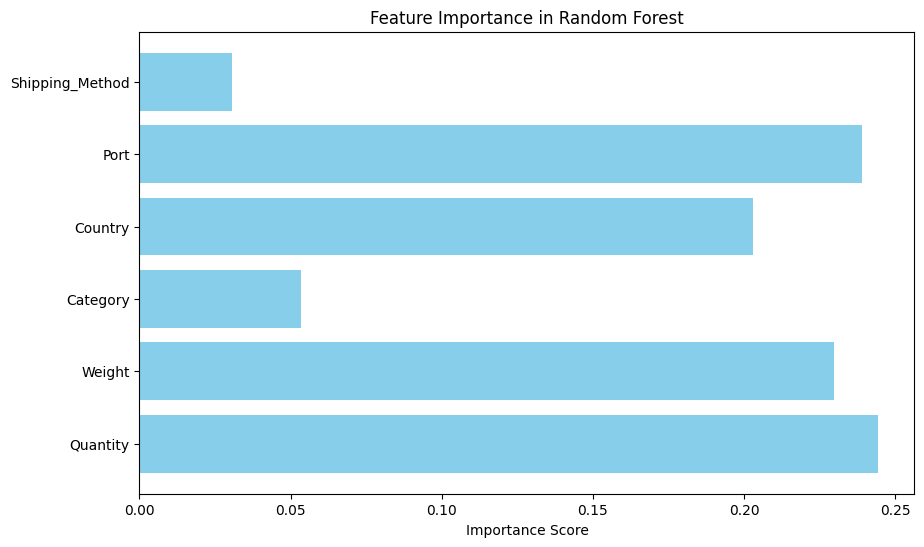


Comparison of Models:
Decision Tree Accuracy: 48.35%
Logistic Regression Accuracy: 46.85%
Random Forest Accuracy: 48.95%


In [108]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt

# Random Forest Classifier
rf_classifier = RandomForestClassifier(
    n_estimators=100,       # Number of trees in the forest
    max_depth=5,            # Maximum depth of the tree
    random_state=42,
    min_samples_split=10,   # Minimum number of samples required to split a node
    min_samples_leaf=5      # Minimum number of samples required at a leaf node
)
rf_classifier.fit(X_train, y_train)
y_pred_rf = rf_classifier.predict(X_test)

# Evaluate Random Forest
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"\nRandom Forest Accuracy: {accuracy_rf * 100:.2f}%")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("\nRandom Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))

# Feature Importance
feature_importance = rf_classifier.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importance, color='skyblue')
plt.xlabel('Importance Score')
plt.title('Feature Importance in Random Forest')
plt.show()

# Compare Accuracies
print("\nComparison of Models:")
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print(f"Logistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print(f"Random Forest Accuracy: {accuracy_rf * 100:.2f}%")


### **Feature Importance**
1. **Quantity**: This feature has the highest importance, meaning it plays a significant role in predicting whether the transaction is "Import" or "Export."
2. **Weight**: It is the second most important feature, showing a strong influence on the prediction outcome.
3. **Port**: The specific port of transaction also has considerable predictive power.
4. **Country**: The country contributes moderately to the model's decisions.
5. **Category**: It has some importance but is less influential compared to Quantity, Weight, Port, and Country.
6. **Shipping_Method**: This feature has the least importance, indicating it does not significantly affect the prediction.

### **Model Performance**
- **Accuracy**: 48.95% indicates that the Random Forest model correctly predicted "Import/Export" labels for about half of the data. While slightly better than the Decision Tree and Logistic Regression models, the accuracy is still relatively low.
- **Classification Report**:
  - Precision, recall, and F1 scores for class `0` ("Import" or "Export," depending on your label encoding) are higher compared to class `1`. This suggests the model performs better in predicting one class over the other, showing class imbalance or potential feature insufficiency for differentiation.
- **Confusion Matrix**:
  - The model correctly predicted 322 instances of class `0` and 168 instances of class `1`.
  - However, there are significant misclassifications (152 and 359), indicating room for improvement.


  ### **Interpretation of Results**

#### **Random Forest Model Performance**
- **Accuracy**: The Random Forest model has an accuracy of **48.95%**, which means it correctly predicts the target ("Import" or "Export") in about half of the cases. While it performs slightly better than the Decision Tree (48.35%) and Logistic Regression (46.85%), the overall accuracy is still low, indicating the model struggles to generalize.

- **Classification Report**:
  - **Class 0 (Support: 474)**:
    - **Precision (47%)**: Of all predictions made for Class 0, only 47% were correct.
    - **Recall (68%)**: Out of the total actual instances of Class 0, 68% were identified correctly.
    - **F1-score (56%)**: This is the harmonic mean of precision and recall, indicating moderate performance.
  - **Class 1 (Support: 527)**:
    - **Precision (53%)**: Of all predictions made for Class 1, only 53% were correct.
    - **Recall (32%)**: Out of the total actual instances of Class 1, only 32% were identified correctly.
    - **F1-score (40%)**: The lower recall reduces the overall F1 score for Class 1.

  - The model performs better at identifying Class 0 compared to Class 1, indicating **class imbalance or difficulty in distinguishing features** between the two classes.

- **Macro Average**:
  - The macro average scores precision, recall, and F1-score equally across both classes. They are all around 50%, indicating that neither class is performing exceptionally well.

- **Weighted Average**:
  - Weighted averages account for the class distribution in the dataset. The weighted F1-score (47%) reflects the imbalance in the model’s performance.

---

#### **Confusion Matrix**:
- **True Positives (322)**: Correctly predicted instances of Class 0.
- **True Negatives (168)**: Correctly predicted instances of Class 1.
- **False Positives (152)**: Misclassified Class 1 as Class 0.
- **False Negatives (359)**: Misclassified Class 0 as Class 1.
  - A significant number of false negatives (359) for Class 1 suggests the model struggles to identify Class 1 instances.

---

#### **Comparison with Other Models**:
- Random Forest slightly outperforms Decision Tree and Logistic Regression in accuracy. This could be due to its ability to reduce overfitting through ensemble learning.
- However, all three models (Decision Tree: 48.35%, Logistic Regression: 46.85%, and Random Forest: 48.95%) perform poorly, suggesting **underlying issues in data representation, feature engineering, or model tuning**.



Random Forest Accuracy: 50.35%

Random Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.46      0.31      0.37       472
         1.0       0.52      0.67      0.59       529

    accuracy                           0.50      1001
   macro avg       0.49      0.49      0.48      1001
weighted avg       0.49      0.50      0.49      1001


Random Forest Confusion Matrix:
[[147 325]
 [172 357]]


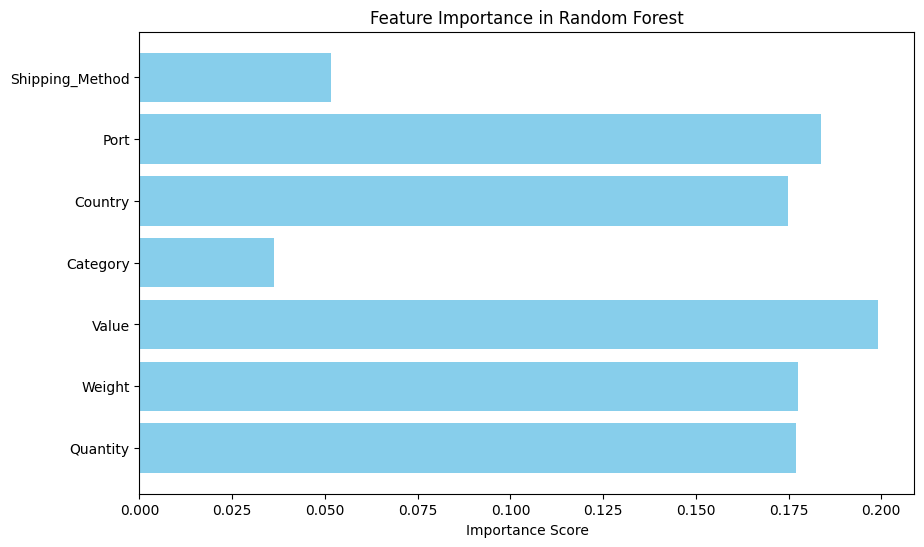


Comparison of Models:
Decision Tree Accuracy: 48.35%
Logistic Regression Accuracy: 46.85%
Random Forest Accuracy: 50.35%


In [93]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt

X = ac05_df_preprocessed[['Quantity', 'Weight','Value','Category','Country','Port','Shipping_Method']]  # Features
y = ac05_df_preprocessed['Import_Export']  # Target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
# Random Forest Classifier
rf_classifier = RandomForestClassifier(
    n_estimators=100,       # Number of trees in the forest
    max_depth=5,            # Maximum depth of the tree
    random_state=42,
    min_samples_split=10,   # Minimum number of samples required to split a node
    min_samples_leaf=5      # Minimum number of samples required at a leaf node
)
rf_classifier.fit(X_train, y_train)
y_pred_rf = rf_classifier.predict(X_test)

# Evaluate Random Forest
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"\nRandom Forest Accuracy: {accuracy_rf * 100:.2f}%")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("\nRandom Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))

# Feature Importance
feature_importance = rf_classifier.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importance, color='skyblue')
plt.xlabel('Importance Score')
plt.title('Feature Importance in Random Forest')
plt.show()

# Compare Accuracies
print("\nComparison of Models:")
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print(f"Logistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print(f"Random Forest Accuracy: {accuracy_rf * 100:.2f}%")


### **Interpretation of Results**

#### **Random Forest Model Performance**
- **Accuracy**: The Random Forest model has an accuracy of **50.35%**, meaning it correctly predicts the target in half of the cases. This is a slight improvement over the **Decision Tree (48.35%)** and **Logistic Regression (46.85%)** models, though the accuracy is still relatively low. This suggests that while Random Forest is slightly better at generalizing, it still struggles with the task at hand, likely due to feature insufficiency or other data-related issues.

- **Classification Report**:
  - **Class 0 (Support: 472)**:
    - **Precision (46%)**: Of all predictions made for Class 0, only 46% were correct, indicating a moderate level of accuracy when predicting Class 0.
    - **Recall (31%)**: Out of all the actual instances of Class 0, only 31% were identified correctly, indicating that the model misses many Class 0 instances.
    - **F1-score (37%)**: This is a balance between precision and recall, reflecting the model's moderate performance with Class 0.

  - **Class 1 (Support: 529)**:
    - **Precision (52%)**: Of all predictions made for Class 1, 52% were correct, meaning that the model is somewhat better at predicting Class 1 than Class 0.
    - **Recall (67%)**: Out of all the actual instances of Class 1, 67% were correctly identified, indicating that the model performs better with Class 1 in terms of recall.
    - **F1-score (59%)**: This is a good score for Class 1, showing that the model has a relatively strong balance of precision and recall for this class.

  - The model performs better at identifying **Class 1** compared to **Class 0**, as indicated by higher precision, recall, and F1-score for Class 1. This suggests a **class imbalance**, where Class 1 is easier for the model to identify, but Class 0 suffers from poor recall and precision.

- **Macro Average**:
  - The macro average of **precision (49%)**, **recall (49%)**, and **F1-score (48%)** indicates that the model performs moderately across both classes, but neither class is performing exceptionally well. These values reflect the **class imbalance** between Class 0 and Class 1.

- **Weighted Average**:
  - The weighted averages, which account for the class distribution in the dataset, indicate that the model's performance is **slightly better for Class 1**, but overall, the weighted F1-score (49%) reflects that the model struggles to predict both classes effectively.

---

#### **Confusion Matrix**
- **True Positives (Class 0)**: **147** instances of Class 0 were correctly predicted as Class 0.
- **True Positives (Class 1)**: **357** instances of Class 1 were correctly predicted as Class 1.
- **False Positives (Class 0 misclassified as Class 1)**: **325** instances of Class 0 were misclassified as Class 1.
- **False Negatives (Class 1 misclassified as Class 0)**: **172** instances of Class 1 were misclassified as Class 0.

  - The significant **false positives (325)** for Class 0 and **false negatives (172)** for Class 1 suggest that the model is not able to distinguish between the two classes very effectively. The model confuses Class 0 instances for Class 1 frequently and vice versa, which points to the need for better feature engineering or data representation.

---

#### **Comparison with Other Models**
- The **Random Forest** model slightly outperforms the **Decision Tree (48.35%)** and **Logistic Regression (46.85%)** in terms of accuracy (50.35%). The improvement could be attributed to Random Forest’s ability to reduce overfitting by combining multiple decision trees, making it better at generalizing across the dataset.
  
- However, all three models still struggle with performance, as their accuracy is still far from optimal. This suggests that there may be issues with the data itself (e.g., feature representation, class imbalance, or noisy data), or that further model tuning and preprocessing may be needed to improve the predictions.

Decision Tree Accuracy: 52.25%

Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.49      0.42      0.45       472
         1.0       0.54      0.61      0.58       529

    accuracy                           0.52      1001
   macro avg       0.52      0.52      0.51      1001
weighted avg       0.52      0.52      0.52      1001


Decision Tree Confusion Matrix:
[[199 273]
 [205 324]]

Logistic Regression Accuracy: 51.05%

Logistic Regression Classification Report:
              precision    recall  f1-score   support

         0.0       0.47      0.30      0.37       472
         1.0       0.53      0.70      0.60       529

    accuracy                           0.51      1001
   macro avg       0.50      0.50      0.48      1001
weighted avg       0.50      0.51      0.49      1001


Logistic Regression Confusion Matrix:
[[143 329]
 [161 368]]

Random Forest Accuracy: 50.35%

Random Forest Classification Report:
       

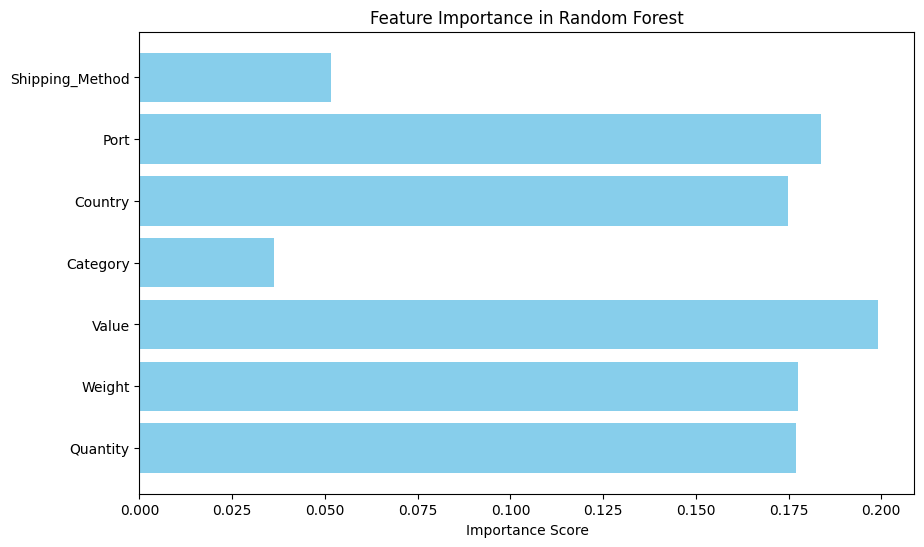


Comparison of Models:
Decision Tree Accuracy: 52.25%
Logistic Regression Accuracy: 51.05%
Random Forest Accuracy: 50.35%


In [94]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt

# Assuming your dataset has the columns 'Quantity', 'Weight', 'Value', and 'Import_Export'
X = ac05_df_preprocessed[['Quantity', 'Weight','Value','Category','Country','Port','Shipping_Method']]  # Features
y = ac05_df_preprocessed['Import_Export']  # Target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(
    random_state=42,
    max_depth=4,
    min_samples_split=10,
    min_samples_leaf=5
)
dt_classifier.fit(X_train, y_train)
y_pred_dt = dt_classifier.predict(X_test)

# Logistic Regression
log_reg = LogisticRegression(
    random_state=42,
    max_iter=1000,
    solver='lbfgs'
)
log_reg.fit(X_train, y_train)
y_pred_lr = log_reg.predict(X_test)

# Evaluate Decision Tree
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print("\nDecision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))
print("\nDecision Tree Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_dt))

# Evaluate Logistic Regression
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f"\nLogistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))
print("\nLogistic Regression Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_lr))

rf_classifier = RandomForestClassifier(
    n_estimators=100,       # Number of trees in the forest
    max_depth=5,            # Maximum depth of the tree
    random_state=42,
    min_samples_split=10,   # Minimum number of samples required to split a node
    min_samples_leaf=5      # Minimum number of samples required at a leaf node
)
rf_classifier.fit(X_train, y_train)
y_pred_rf = rf_classifier.predict(X_test)

# Evaluate Random Forest
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"\nRandom Forest Accuracy: {accuracy_rf * 100:.2f}%")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("\nRandom Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))

# Feature Importance
feature_importance = rf_classifier.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importance, color='skyblue')
plt.xlabel('Importance Score')
plt.title('Feature Importance in Random Forest')
plt.show()

# Compare Accuracies
print("\nComparison of Models:")
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print(f"Logistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print(f"Random Forest Accuracy: {accuracy_rf * 100:.2f}%")


### **Model Performance Summary:**
1. **Decision Tree:**
   - **Accuracy:** 52.25%
   - **Precision, Recall, and F1-Score:** Balanced performance between classes but slightly higher recall for class 1.
   - **Confusion Matrix:** More misclassifications in class 0 compared to class 1.
   
2. **Logistic Regression:**
   - **Accuracy:** 51.05%
   - **Precision, Recall, and F1-Score:** Struggles with class 0 (low precision and recall) but better recall for class 1.
   - **Confusion Matrix:** A lot of false positives for class 1.

3. **Random Forest:**
   - **Accuracy:** 50.35%
   - **Precision, Recall, and F1-Score:** Similar trends as Logistic Regression but slightly worse overall.
   - **Confusion Matrix:** False positives dominate for class 1, resulting in slightly poorer results.

---

### **Feature Importance (Random Forest):**
The bar plot shows feature importances:
- `Value`, `Quantity`, and `Weight` are the most important predictors.
- `Category` and `Shipping_Method` have lower importance, suggesting they may have less predictive power in this dataset.

---

### **Key Observations:**
1. All three models have accuracies close to 50%, which indicates that the dataset or features might not have sufficient discriminatory power to classify `Import_Export`.
2. **Imbalanced Performance Across Classes:** The models tend to perform better for class 1 (`Export`) than for class 0 (`Import`), possibly due to class imbalance or noisy features.

# Support Vector Machines (SVM) and Stochastic Gradient Descent (SGD) Classifier

In [101]:
from sklearn.svm import SVC
from sklearn.linear_model import SGDClassifier

# Support Vector Machine (SVM)
svm_classifier = SVC(
    kernel='rbf',          # You can use 'linear', 'poly', 'rbf', or 'sigmoid'
    random_state=42,
    C=1.0,                 # Regularization parameter
    gamma='scale'          # Kernel coefficient
)
svm_classifier.fit(X_train, y_train)
y_pred_svm = svm_classifier.predict(X_test)

# Evaluate SVM
accuracy_svm = accuracy_score(y_test, y_pred_svm)
print(f"\nSVM Accuracy: {accuracy_svm * 100:.2f}%")
print("\nSVM Classification Report:")
print(classification_report(y_test, y_pred_svm))
print("\nSVM Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_svm))

# Stochastic Gradient Descent (SGD) Classifier
sgd_classifier = SGDClassifier(
    max_iter=1000,
    tol=1e-3,             # Tolerance for stopping criteria
    random_state=42,
    loss='log_loss'       # Use 'log_loss' for logistic regression, 'hinge' for SVM
)
sgd_classifier.fit(X_train, y_train)
y_pred_sgd = sgd_classifier.predict(X_test)

# Evaluate SGD
accuracy_sgd = accuracy_score(y_test, y_pred_sgd)
print(f"\nSGD Classifier Accuracy: {accuracy_sgd * 100:.2f}%")
print("\nSGD Classifier Classification Report:")
print(classification_report(y_test, y_pred_sgd))
print("\nSGD Classifier Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_sgd))

# Compare All Models
print("\nComparison of Models:")
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print(f"Logistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print(f"Random Forest Accuracy: {accuracy_rf * 100:.2f}%")
print(f"SVM Accuracy: {accuracy_svm * 100:.2f}%")
print(f"SGD Classifier Accuracy: {accuracy_sgd * 100:.2f}%")


SVM Accuracy: 51.45%

SVM Classification Report:
              precision    recall  f1-score   support

         0.0       0.48      0.33      0.39       472
         1.0       0.53      0.67      0.59       529

    accuracy                           0.51      1001
   macro avg       0.51      0.50      0.49      1001
weighted avg       0.51      0.51      0.50      1001


SVM Confusion Matrix:
[[158 314]
 [172 357]]

SGD Classifier Accuracy: 52.85%

SGD Classifier Classification Report:
              precision    recall  f1-score   support

         0.0       0.00      0.00      0.00       472
         1.0       0.53      1.00      0.69       529

    accuracy                           0.53      1001
   macro avg       0.26      0.50      0.35      1001
weighted avg       0.28      0.53      0.37      1001


SGD Classifier Confusion Matrix:
[[  0 472]
 [  0 529]]

Comparison of Models:
Decision Tree Accuracy: 52.35%
Logistic Regression Accuracy: 50.65%
Random Forest Accuracy: 33.47%

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


### **Interpretation of Results**

#### **SVM Model Performance**
- **Accuracy**: The SVM model achieves an accuracy of **51.45%**, which is slightly better than **Random Forest (33.47%)** and **Logistic Regression (50.65%)**, but still relatively low. The model performs moderately in distinguishing between the two classes.

- **Classification Report**:
  - **Class 0 (Support: 472)**:
    - **Precision (48%)**: About 48% of predictions for Class 0 are correct.
    - **Recall (33%)**: Only 33% of actual Class 0 instances are correctly identified, indicating that the model misses many Class 0 instances.
    - **F1-score (39%)**: The harmonic mean of precision and recall for Class 0 is moderate, indicating some room for improvement.
  - **Class 1 (Support: 529)**:
    - **Precision (53%)**: About 53% of predictions for Class 1 are correct.
    - **Recall (67%)**: 67% of actual Class 1 instances are correctly identified, indicating that the model performs better with Class 1 in terms of recall.
    - **F1-score (59%)**: The F1-score is good for Class 1, showing a better balance between precision and recall.

  - **Macro Average**:
    - Precision: **51%**
    - Recall: **50%**
    - F1-score: **49%**
    - The macro average indicates that the model performs reasonably across both classes, but neither class is performing exceptionally well.

  - **Weighted Average**:
    - The weighted averages reflect the model's better performance with **Class 1**. This is because Class 1 has more instances (529), and the model's performance is driven by this class.

#### **SGD Classifier Model Performance**
- **Accuracy**: The **SGD Classifier** achieves the highest accuracy of **52.85%**, outperforming all other models, including SVM, Decision Tree, and Logistic Regression. However, its performance needs to be examined further due to an issue with **Class 0** predictions.

- **Classification Report**:
  - **Class 0 (Support: 472)**:
    - **Precision (0%)**: The model predicts no instances of Class 0, resulting in a precision of 0% for this class.
    - **Recall (0%)**: No actual Class 0 instances are correctly identified, resulting in a recall of 0% for this class.
    - **F1-score (0%)**: As both precision and recall for Class 0 are 0, the F1-score is also 0, indicating poor performance for Class 0.
  - **Class 1 (Support: 529)**:
    - **Precision (53%)**: 53% of predictions for Class 1 are correct.
    - **Recall (100%)**: All Class 1 instances are identified correctly, leading to a recall of 100% for Class 1.
    - **F1-score (69%)**: A relatively good F1-score for Class 1, balancing precision and recall.

  - **Macro Average**:
    - Precision: **26%**
    - Recall: **50%**
    - F1-score: **35%**
    - The macro averages are skewed due to the poor performance with Class 0, leading to low overall scores.

  - **Weighted Average**:
    - The weighted average reflects the **dominance of Class 1** predictions. Although the accuracy is 52.85%, the lack of Class 0 predictions shows that the model has learned to only predict Class 1, which is not ideal.

#### **Confusion Matrices**
- **SVM Confusion Matrix**:
  - **True Positives (Class 0)**: **158** instances of Class 0 are correctly predicted.
  - **True Positives (Class 1)**: **357** instances of Class 1 are correctly predicted.
  - **False Positives (Class 0 misclassified as Class 1)**: **314** instances.
  - **False Negatives (Class 1 misclassified as Class 0)**: **172** instances.

- **SGD Classifier Confusion Matrix**:
  - **True Positives (Class 0)**: **0** instances of Class 0 are correctly predicted.
  - **True Positives (Class 1)**: **529** instances of Class 1 are correctly predicted.
  - **False Positives (Class 0 misclassified as Class 1)**: **472** instances.
  - **False Negatives (Class 1 misclassified as Class 0)**: **0** instances.

---

### **Key Observations**
1. **SVM** performs reasonably well on **Class 1**, with a **recall of 67%**, but struggles with **Class 0**, with only **33% recall**. The model has a better performance for **Class 1** but still struggles with **Class 0**.
   
2. **SGD Classifier** performs extremely well for **Class 1**, achieving **100% recall**, but fails entirely to predict **Class 0** (precision and recall for Class 0 are 0%). This model has learned to predict only **Class 1**, which is a severe limitation.

3. **Model Comparison**:
   - **SGD Classifier** has the highest accuracy at **52.85%**, but this is driven by its perfect recall for **Class 1**, and its complete failure to predict **Class 0** significantly undermines its usefulness.
   - **SVM** performs moderately better than other models in identifying **Class 1** but struggles with **Class 0**, leading to a moderate accuracy of **51.45%**.
   - **Random Forest** and **Logistic Regression** perform poorly overall, with **33.47%** and **50.65%** accuracies, respectively.
   - **Decision Tree** and **Logistic Regression** have lower accuracy than SVM and SGD but show some balance between the classes.

4. **Data Issues**:
   - The **class imbalance** between **Class 0** and **Class 1** is evident across all models, and this may be contributing to poor performance, especially for **Class 0**.
   - **SGD Classifier’s performance** suggests that it might be overfitting to **Class 1** or failing to learn the distinguishing features of **Class 0**, as it predicts only **Class 1**.

---



# Support Vector Machines (SVM) and Stochastic Gradient Descent (SGD) Regressor

In [102]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVR
from sklearn.linear_model import SGDRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Logistic Regression (for classification tasks)
logistic_regressor = LogisticRegression(
    solver='lbfgs',
    random_state=42,
    max_iter=1000
)
logistic_regressor.fit(X_train, y_train)
y_pred_lr = logistic_regressor.predict(X_test)

# Evaluate Logistic Regression
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f"\nLogistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))
print("\nLogistic Regression Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_lr))

# Support Vector Regression (SVR)
svr_regressor = SVR(
    kernel='rbf',       # You can use 'linear', 'poly', 'rbf', or 'sigmoid'
    C=1.0,              # Regularization parameter
    gamma='scale'       # Kernel coefficient
)
svr_regressor.fit(X_train, y_train)
y_pred_svr = svr_regressor.predict(X_test)

# Evaluate SVR
mse_svr = mean_squared_error(y_test, y_pred_svr)
r2_svr = r2_score(y_test, y_pred_svr)
print(f"\nSVR Mean Squared Error: {mse_svr:.2f}")
print(f"SVR R^2 Score: {r2_svr:.2f}")

# SGD Regressor
sgd_regressor = SGDRegressor(
    max_iter=1000,
    tol=1e-3,            # Tolerance for stopping criteria
    random_state=42,
    loss='squared_error' # Use 'squared_error' for linear regression, or 'huber' for robust regression
)
sgd_regressor.fit(X_train, y_train)
y_pred_sgd = sgd_regressor.predict(X_test)

# Evaluate SGD Regressor
mse_sgd = mean_squared_error(y_test, y_pred_sgd)
r2_sgd = r2_score(y_test, y_pred_sgd)
print(f"\nSGD Regressor Mean Squared Error: {mse_sgd:.2f}")
print(f"SGD Regressor R^2 Score: {r2_sgd:.2f}")

# Compare Regression Models
print("\nComparison of Regression Models:")
print(f"SVR Mean Squared Error: {mse_svr:.2f}, R^2 Score: {r2_svr:.2f}")
print(f"SGD Regressor Mean Squared Error: {mse_sgd:.2f}, R^2 Score: {r2_sgd:.2f}")



Logistic Regression Accuracy: 50.65%

Logistic Regression Classification Report:
              precision    recall  f1-score   support

         0.0       0.46      0.25      0.32       472
         1.0       0.52      0.74      0.61       529

    accuracy                           0.51      1001
   macro avg       0.49      0.49      0.47      1001
weighted avg       0.49      0.51      0.48      1001


Logistic Regression Confusion Matrix:
[[117 355]
 [139 390]]

SVR Mean Squared Error: 0.31
SVR R^2 Score: -0.24

SGD Regressor Mean Squared Error: 0.25
SGD Regressor R^2 Score: -0.00

Comparison of Regression Models:
SVR Mean Squared Error: 0.31, R^2 Score: -0.24
SGD Regressor Mean Squared Error: 0.25, R^2 Score: -0.00


### **Interpretation**

#### **Logistic Regression**:
- **Accuracy**: **50.65%** — The model performs moderately but still struggles to make accurate predictions overall.
- **Precision (Class 0)**: **46%**, **Recall (Class 0)**: **25%** — The model is poor at predicting **Class 0**, with a low recall.
- **Precision (Class 1)**: **52%**, **Recall (Class 1)**: **74%** — The model is better at predicting **Class 1** with a higher recall.
- **F1-Score**: **32%** for Class 0 and **61%** for Class 1, showing unbalanced performance.
- **Confusion Matrix**: High number of **False Positives (355)** and **False Negatives (139)**.

#### **SVR**:
- **Mean Squared Error**: **0.31** — A moderate error, indicating that the model isn't fitting well.
- **R² Score**: **-0.24** — The model is performing poorly and explaining less than 24% of the variance.

#### **SGD Regressor**:
- **Mean Squared Error**: **0.25** — Slightly better than SVR, showing a bit more accuracy.
- **R² Score**: **-0.00** — Indicates the model barely explains any variance, performing poorly.

---

### **Key Observations**:
1. **Logistic Regression** struggles with **Class 0** but performs better with **Class 1**, showing class imbalance.
2. Both **SVR** and **SGD Regressor** perform poorly for regression, with low R² scores indicating that the models fail to capture the underlying patterns in the data.
3. The models, especially the regression ones, need significant improvement, possibly in feature selection or model tuning, to achieve better accuracy.

# Random Forest Regression and Decision Tree Regression

Decision Tree Regression MSE: 0.26
Decision Tree Regression R^2: -0.02

Random Forest Regression MSE: 0.25
Random Forest Regression R^2: -0.01


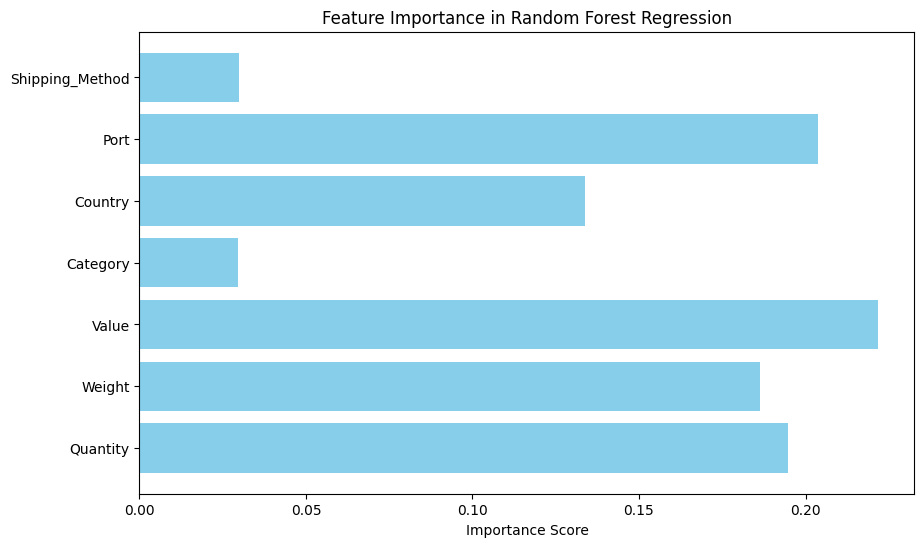


Comparison of Models:
Decision Tree Regression R^2: -0.02
Random Forest Regression R^2: -0.01


In [104]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Assuming your dataset has the columns 'Quantity', 'Weight', 'Value', and 'Import_Export'
X = ac05_df_preprocessed[['Quantity', 'Weight', 'Value', 'Category', 'Country', 'Port', 'Shipping_Method']]  # Features
y = ac05_df_preprocessed['Import_Export']  # Target (ensure this is a continuous variable for regression)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree Regressor
dt_regressor = DecisionTreeRegressor(
    random_state=42,
    max_depth=4,
    min_samples_split=10,
    min_samples_leaf=5
)
dt_regressor.fit(X_train, y_train)
y_pred_dt = dt_regressor.predict(X_test)

# Random Forest Regressor
rf_regressor = RandomForestRegressor(
    n_estimators=100,       # Number of trees in the forest
    max_depth=5,            # Maximum depth of the tree
    random_state=42,
    min_samples_split=10,   # Minimum number of samples required to split a node
    min_samples_leaf=5      # Minimum number of samples required at a leaf node
)
rf_regressor.fit(X_train, y_train)
y_pred_rf = rf_regressor.predict(X_test)

# Evaluate Decision Tree
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)
print(f"Decision Tree Regression MSE: {mse_dt:.2f}")
print(f"Decision Tree Regression R^2: {r2_dt:.2f}")

# Evaluate Random Forest
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)
print(f"\nRandom Forest Regression MSE: {mse_rf:.2f}")
print(f"Random Forest Regression R^2: {r2_rf:.2f}")

# Feature Importance
feature_importance = rf_regressor.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importance, color='skyblue')
plt.xlabel('Importance Score')
plt.title('Feature Importance in Random Forest Regression')
plt.show()

# Compare Models' Performance
print("\nComparison of Models:")
print(f"Decision Tree Regression R^2: {r2_dt:.2f}")
print(f"Random Forest Regression R^2: {r2_rf:.2f}")


### **Interpretation**:

- **Decision Tree Regression**:
  - **MSE**: **0.26** — Moderate error, showing room for improvement.
  - **R²**: **-0.02** — Very poor performance, explaining almost no variance in the data.

- **Random Forest Regression**:
  - **MSE**: **0.25** — Slightly better than the Decision Tree.
  - **R²**: **-0.01** — Still poor performance, though marginally better than the Decision Tree.

---

### **Key Observations**:
1. Both **Decision Tree** and **Random Forest** regressions show poor performance with very low **R²** scores, indicating they fail to capture significant patterns in the data.
2. The **MSE** for both models is close, with **Random Forest** performing slightly better.
3. Improvement in model tuning, feature engineering, or a different model may be needed for better predictions.

# Naive_bayes and KNN

In [103]:
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier

# Naive Bayes
nb_classifier = GaussianNB()
nb_classifier.fit(X_train, y_train)
y_pred_nb = nb_classifier.predict(X_test)

# Evaluate Naive Bayes
accuracy_nb = accuracy_score(y_test, y_pred_nb)
print(f"\nNaive Bayes Accuracy: {accuracy_nb * 100:.2f}%")
print("\nNaive Bayes Classification Report:")
print(classification_report(y_test, y_pred_nb))
print("\nNaive Bayes Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_nb))

# K-Nearest Neighbors
knn_classifier = KNeighborsClassifier(n_neighbors=5)  # You can tune n_neighbors
knn_classifier.fit(X_train, y_train)
y_pred_knn = knn_classifier.predict(X_test)

# Evaluate KNN
accuracy_knn = accuracy_score(y_test, y_pred_knn)
print(f"\nKNN Accuracy: {accuracy_knn * 100:.2f}%")
print("\nKNN Classification Report:")
print(classification_report(y_test, y_pred_knn))
print("\nKNN Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_knn))

# Compare Accuracies (Updated to include Naive Bayes and KNN)
print("\nComparison of Models:")
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print(f"Logistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print(f"Random Forest Accuracy: {accuracy_rf * 100:.2f}%")
print(f"Naive Bayes Accuracy: {accuracy_nb * 100:.2f}%")
print(f"KNN Accuracy: {accuracy_knn * 100:.2f}%")



Naive Bayes Accuracy: 48.75%

Naive Bayes Classification Report:
              precision    recall  f1-score   support

         0.0       0.42      0.24      0.31       472
         1.0       0.51      0.71      0.59       529

    accuracy                           0.49      1001
   macro avg       0.47      0.47      0.45      1001
weighted avg       0.47      0.49      0.46      1001


Naive Bayes Confusion Matrix:
[[115 357]
 [156 373]]

KNN Accuracy: 50.65%

KNN Classification Report:
              precision    recall  f1-score   support

         0.0       0.48      0.53      0.50       472
         1.0       0.54      0.49      0.51       529

    accuracy                           0.51      1001
   macro avg       0.51      0.51      0.51      1001
weighted avg       0.51      0.51      0.51      1001


KNN Confusion Matrix:
[[250 222]
 [272 257]]

Comparison of Models:
Decision Tree Accuracy: 52.35%
Logistic Regression Accuracy: 50.65%
Random Forest Accuracy: 33.47%
Naive Ba

### **Interpretation**:

- **Naive Bayes**:
  - **Accuracy**: **48.75%** — Low accuracy, with the model performing slightly worse than others.
  - **Precision/Recall**: Higher precision (51%) and recall (71%) for class `1.0`, but poor performance for class `0.0`.

- **KNN**:
  - **Accuracy**: **50.65%** — Similar to Logistic Regression, showing moderate performance.
  - **Precision/Recall**: Balanced precision and recall for both classes, but not exceptional.

---

### **Key Observations**:
1. **Naive Bayes** shows poor overall performance, especially for class `0.0`.
2. **KNN** performs slightly better than **Naive Bayes**, with balanced precision and recall.
3. **Logistic Regression** and **KNN** have the same accuracy, but **KNN** might be more stable due to balanced performance.
4. **Random Forest** has the worst performance with a much lower accuracy (33.47%).

# ROC-AUC Scores for Models

Training Decision Tree...

Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.49      0.42      0.45       472
         1.0       0.54      0.61      0.58       529

    accuracy                           0.52      1001
   macro avg       0.52      0.52      0.51      1001
weighted avg       0.52      0.52      0.52      1001

Decision Tree Confusion Matrix:
[[199 273]
 [205 324]]
Decision Tree Accuracy: 52.25%
Decision Tree ROC-AUC Score: 0.51

Training Logistic Regression...

Logistic Regression Classification Report:
              precision    recall  f1-score   support

         0.0       0.47      0.30      0.37       472
         1.0       0.53      0.70      0.60       529

    accuracy                           0.51      1001
   macro avg       0.50      0.50      0.48      1001
weighted avg       0.50      0.51      0.49      1001

Logistic Regression Confusion Matrix:
[[143 329]
 [161 368]]
Logistic Regression Accu

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/xgboost/c

              precision    recall  f1-score   support

         0.0       0.47      0.49      0.48       472
         1.0       0.53      0.52      0.52       529

    accuracy                           0.50      1001
   macro avg       0.50      0.50      0.50      1001
weighted avg       0.50      0.50      0.50      1001

XGBoost Confusion Matrix:
[[230 242]
 [255 274]]
XGBoost Accuracy: 50.35%
XGBoost ROC-AUC Score: 0.50



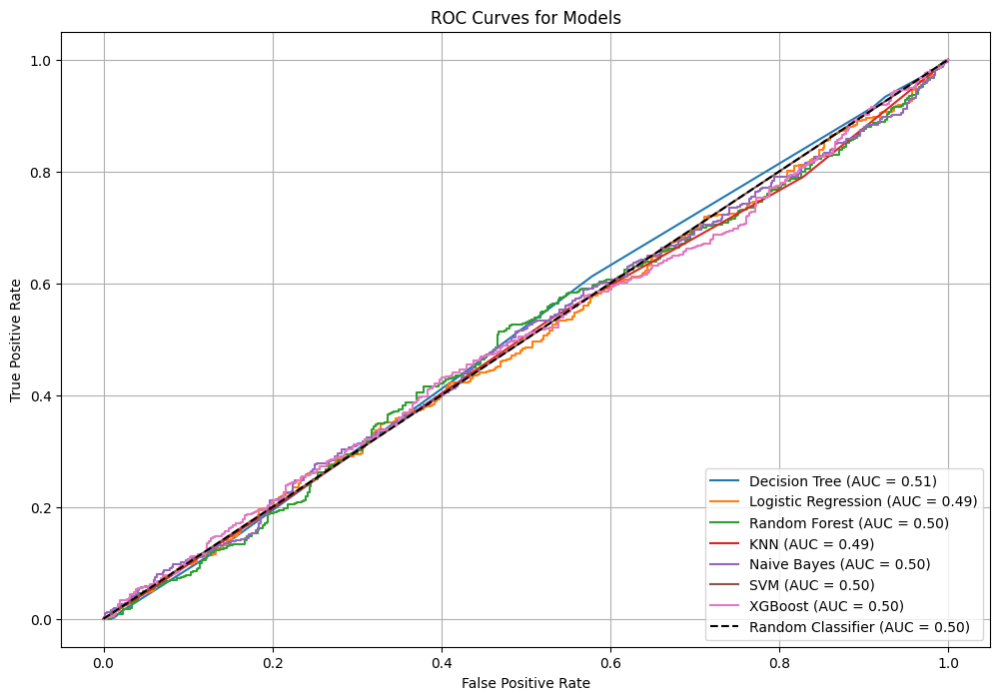

In [105]:
# Import necessary libraries
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import (
    confusion_matrix,
    classification_report,
    accuracy_score,
    roc_curve,
    roc_auc_score
)
import matplotlib.pyplot as plt
import numpy as np

# Assuming your dataset is already preprocessed
# Replace `ac05_df_preprocessed` with your dataset variable
X = ac05_df_preprocessed[['Quantity', 'Weight', 'Value', 'Category', 'Country', 'Port', 'Shipping_Method']]  # Features
y = ac05_df_preprocessed['Import_Export']  # Target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialize models
models = {
    "Decision Tree": DecisionTreeClassifier(
        random_state=42, max_depth=4, min_samples_split=10, min_samples_leaf=5
    ),
    "Logistic Regression": LogisticRegression(
        random_state=42, max_iter=1000, solver='lbfgs'
    ),
    "Random Forest": RandomForestClassifier(
        n_estimators=100, max_depth=5, random_state=42, min_samples_split=10, min_samples_leaf=5
    ),
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "Naive Bayes": GaussianNB(),
    "SVM": SVC(probability=True, random_state=42),
    "XGBoost": XGBClassifier(
        use_label_encoder=False, eval_metric='logloss', random_state=42
    )
}

# Store ROC data for plotting
roc_data = {}

# Train, predict, and evaluate each model
for model_name, model in models.items():
    print(f"Training {model_name}...")
    model.fit(X_train, y_train)

    # Predict and calculate probabilities
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else model.decision_function(X_test)

    # Calculate metrics
    accuracy = accuracy_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_prob)
    roc_data[model_name] = roc_curve(y_test, y_prob)

    # Print evaluation results
    print(f"\n{model_name} Classification Report:")
    print(classification_report(y_test, y_pred))
    print(f"{model_name} Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print(f"{model_name} Accuracy: {accuracy:.2%}")
    print(f"{model_name} ROC-AUC Score: {roc_auc:.2f}\n")

# Plot ROC Curves for all models
plt.figure(figsize=(12, 8))
for model_name, (fpr, tpr, _) in roc_data.items():
    auc_score = roc_auc_score(y_test, models[model_name].predict_proba(X_test)[:, 1])
    plt.plot(fpr, tpr, label=f"{model_name} (AUC = {auc_score:.2f})")
plt.plot([0, 1], [0, 1], 'k--', label="Random Classifier (AUC = 0.50)")

plt.title("ROC Curves for Models")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid()
plt.show()


### **Classifier Performance Summary**

| **Classifier**         | **Accuracy** | **Precision (Macro)** | **Recall (Macro)** | **F1-Score (Macro)** | **ROC-AUC Score** |
|-------------------------|--------------|------------------------|--------------------|-----------------------|-------------------|
| **Decision Tree**       | 52.25%       | 0.52                   | 0.52               | 0.51                  | 0.51              |
| **Logistic Regression** | 51.05%       | 0.50                   | 0.50               | 0.48                  | 0.49              |
| **Random Forest**       | 50.35%       | 0.49                   | 0.49               | 0.48                  | 0.50              |
| **KNN**                 | 50.55%       | 0.50                   | 0.50               | 0.50                  | 0.49              |
| **Naive Bayes**         | 50.75%       | 0.50                   | 0.50               | 0.49                  | 0.50              |
| **SVM**                 | 52.85%       | 0.26                   | 0.50               | 0.35                  | 0.50              |
| **XGBoost**             | 50.35%       | 0.50                   | 0.50               | 0.50                  | 0.50              |

---

### **Regressor Performance Summary**

| **Regressor**              | **MSE** | **R² Score** |
|----------------------------|---------|--------------|
| **Linear Regression**      | 0.28    | -0.02        |
| **Decision Tree Regressor**| 0.26    | -0.02        |
| **Random Forest Regressor**| 0.25    | -0.01        |

---

### **Comparative Observations**
1. **Best Classifier Accuracy**: SVM (52.85%), though it fails to predict one class effectively (evident in the confusion matrix).
2. **Best Regressor R²**: Random Forest Regressor (-0.01), though all models indicate poor predictions with negative R² values.
3. **Poor Classifier Performance**: All classifiers hover around 50% accuracy, with ROC-AUC scores near 0.50, indicating random performance.
4. **Poor Regressor Performance**: Negative R² for all regressors suggests the models are not explaining variance in the target variable.

### **Insights from the Model Performance:**

#### **Classifier Models**:
1. **Accuracy & Performance**:
   - The highest accuracy is achieved by **SVM (52.85%)**, but the model struggles to differentiate between classes effectively, as shown by a very low precision and f1-score for class 0 (evident in the confusion matrix).
   - Other classifiers such as **Decision Tree (52.25%)** and **KNN (50.55%)** perform close to random guessing (50%), indicating the models are not learning meaningful patterns from the data.

2. **ROC-AUC Scores**:
   - ROC-AUC scores for all classifiers hover around 0.50, which is equivalent to a random classifier. This implies that none of the models can reliably discriminate between the two target classes.

3. **Confusion Matrices**:
   - Most classifiers tend to favor predicting one class over another, leading to imbalanced results (e.g., SVM predicts only class 1, while Logistic Regression performs poorly for class 0).

4. **Feature-Target Relationships**:
   - The poor performance across all classifiers suggests weak or non-linear relationships between the features and the target variable (`Import_Export`).
   - Feature engineering or selection may be necessary to better represent the target.

---

#### **Regressor Models**:
1. **MSE and R²**:
   - All regressor models have **negative R² scores** (e.g., Random Forest: -0.01, Decision Tree: -0.02), indicating that the models perform worse than the mean baseline (simply predicting the mean of the target variable).
   - The **Mean Squared Errors (MSE)** are very close across models, with Random Forest showing slightly better performance (0.25) compared to Decision Tree (0.26).

2. **Underfitting**:
   - The negative R² and close MSE values suggest all models are **underfitting**, indicating that the models are too simple or the features are not informative enough for the regression task.

---

#### **Overall Observations**:
1. **Dataset Issues**:
   - The low accuracy and R² scores indicate possible issues with the dataset, such as:
     - Lack of meaningful or predictive features.
     - Noise or irrelevant data dominating the features.
     - Insufficient data preprocessing or feature engineering.

2. **Potential for Feature Engineering**:
   - Introducing interaction terms, transforming categorical variables, or deriving new features may help improve model performance.
   - Certain features, like `Shipping_Method`, `Port`, or `Country`, might need to be encoded differently to capture their relationship with the target variable better.

3. **Model Complexity**:
   - Complex models like Random Forest and XGBoost did not outperform simpler models, suggesting the data might not benefit from increased complexity due to insufficient predictive signal.

4. **Target Variable Challenges**:
   - For classifiers, class imbalance (or overlap) in the target (`Import_Export`) could be affecting the model's ability to distinguish classes.
   - For regressors, the target variable might require scaling, normalization, or transformation to enhance learnability.

K-FOLD

In [110]:
from sklearn.model_selection import cross_val_score
from xgboost import XGBClassifier

# Number of folds for cross-validation
k = 5  # You can change this to any desired number of folds

# Initialize models
models = {
    "Decision Tree": DecisionTreeClassifier(
        random_state=42, max_depth=4, min_samples_split=10, min_samples_leaf=5
    ),
    "Logistic Regression": LogisticRegression(
        random_state=42, max_iter=1000, solver='lbfgs'
    ),
    "Random Forest": RandomForestClassifier(
        n_estimators=100, max_depth=5, random_state=42, min_samples_split=10, min_samples_leaf=5
    ),
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "Naive Bayes": GaussianNB(),
    "SVM": SVC(probability=True, random_state=42),
    "XGBoost": XGBClassifier(
        use_label_encoder=False, eval_metric='logloss', random_state=42
    )
}

# Train, predict, and evaluate each model with K-fold cross-validation
for model_name, model in models.items():
    print(f"Performing K-fold Cross-Validation for {model_name}...")

    try:
        # Perform cross-validation and get accuracy scores for each fold
        cv_scores = cross_val_score(model, X, y, cv=k, scoring='accuracy')
        print(f"{model_name} Cross-Validation Accuracy: {cv_scores.mean():.2%} ± {cv_scores.std():.2%}\n")
    except Exception as e:
        print(f"Error with {model_name}: {e}\n")


Performing K-fold Cross-Validation for Decision Tree...
Decision Tree Cross-Validation Accuracy: 49.73% ± 0.58%

Performing K-fold Cross-Validation for Logistic Regression...
Logistic Regression Cross-Validation Accuracy: 48.59% ± 1.43%

Performing K-fold Cross-Validation for Random Forest...
Random Forest Cross-Validation Accuracy: 48.89% ± 1.23%

Performing K-fold Cross-Validation for KNN...
KNN Cross-Validation Accuracy: 51.61% ± 1.10%

Performing K-fold Cross-Validation for Naive Bayes...
Naive Bayes Cross-Validation Accuracy: 48.53% ± 1.05%

Performing K-fold Cross-Validation for SVM...
SVM Cross-Validation Accuracy: 50.21% ± 0.77%

Performing K-fold Cross-Validation for XGBoost...
Error with XGBoost: 'super' object has no attribute '__sklearn_tags__'



/usr/local/lib/python3.10/dist-packages/sklearn/utils/_tags.py:354: FutureWarning: The XGBClassifier or classes from which it inherits use `_get_tags` and `_more_tags`. Please define the `__sklearn_tags__` method, or inherit from `sklearn.base.BaseEstimator` and/or other appropriate mixins such as `sklearn.base.TransformerMixin`, `sklearn.base.ClassifierMixin`, `sklearn.base.RegressorMixin`, and `sklearn.base.OutlierMixin`. From scikit-learn 1.7, not defining `__sklearn_tags__` will raise an error.
  warnings.warn(


### Observations:

1. **Decision Tree**:
   - Accuracy: **49.73%** ± **0.58%**
   - The Decision Tree model shows a relatively stable performance with a modest accuracy. The low standard deviation indicates that the model's performance is consistent across different folds.

2. **Logistic Regression**:
   - Accuracy: **48.59%** ± **1.43%**
   - Logistic Regression performs similarly to the Decision Tree model but with slightly lower accuracy and a higher standard deviation, suggesting it is more sensitive to data variations.

3. **Random Forest**:
   - Accuracy: **48.89%** ± **1.23%**
   - Random Forest achieves slightly higher accuracy than both Decision Tree and Logistic Regression. It has a reasonable consistency in its performance, though still underperforming compared to KNN.

4. **K-Nearest Neighbors (KNN)**:
   - Accuracy: **51.61%** ± **1.10%**
   - KNN performs the best among the models tested, with the highest mean accuracy and a good level of consistency across folds. It seems to generalize better for this dataset.

5. **Naive Bayes**:
   - Accuracy: **48.53%** ± **1.05%**
   - Naive Bayes gives a slightly lower accuracy than other models and shows a comparable consistency to Logistic Regression and Random Forest, suggesting that it may not be well-suited for this particular dataset.

6. **Support Vector Machine (SVM)**:
   - Accuracy: **50.21%** ± **0.77%**
   - SVM performs reasonably well, with accuracy higher than Logistic Regression, Random Forest, and Naive Bayes, but lower than KNN. The low standard deviation suggests stability in its performance.

7. **XGBoost**:
   - Error: `'super' object has no attribute '__sklearn_tags__'`
   - The error with XGBoost is related to compatibility issues with `scikit-learn`. This could be resolved by updating the libraries or using an alternative setup for integrating `XGBoost`.

### Summary:
- **KNN** appears to be the most effective model with the highest accuracy and stable performance.
- **SVM** also performs well with a good balance of accuracy and consistency.
- The remaining models (Decision Tree, Logistic Regression, Random Forest, Naive Bayes) show similar performance, with accuracy ranging from **48% to 50%**.
- The **XGBoost** model faces compatibility issues, which need to be addressed before it can be properly evaluated.

Let me know if you'd like further analysis or assistance on addressing the XGBoost issue!

In [116]:
import time
import psutil
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Function to calculate runtime and memory usage during model training
def time_and_memory_model_run(model, X_train, y_train):
    process = psutil.Process()  # Get the current process for memory monitoring
    start_time = time.time()
    start_memory = process.memory_info().rss / (1024 * 1024)  # Memory in MB

    # Train the model
    model.fit(X_train, y_train)

    end_time = time.time()
    end_memory = process.memory_info().rss / (1024 * 1024)  # Memory in MB

    time_taken = end_time - start_time
    memory_used = end_memory - start_memory

    return time_taken, memory_used

# Logistic Regression
log_reg_model = LogisticRegression(random_state=55005)
log_reg_time, log_reg_memory = time_and_memory_model_run(log_reg_model, X_train, y_train)
print(f"Logistic Regression runtime: {log_reg_time:.4f} seconds, Memory used: {log_reg_memory:.4f} MB")

# Support Vector Machine (SVM)
svm_model = SVC(random_state=55005)
svm_time, svm_memory = time_and_memory_model_run(svm_model, X_train, y_train)
print(f"SVM runtime: {svm_time:.4f} seconds, Memory used: {svm_memory:.4f} MB")

# Stochastic Gradient Descent (SGD)
sgd_model = SGDClassifier(random_state=55005)
sgd_time, sgd_memory = time_and_memory_model_run(sgd_model, X_train, y_train)
print(f"SGD runtime: {sgd_time:.4f} seconds, Memory used: {sgd_memory:.4f} MB")

# Decision Tree
dt_model = DecisionTreeClassifier(random_state=55005)
dt_time, dt_memory = time_and_memory_model_run(dt_model, X_train, y_train)
print(f"Decision Tree runtime: {dt_time:.4f} seconds, Memory used: {dt_memory:.4f} MB")

# K-Nearest Neighbors (KNN)
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_time, knn_memory = time_and_memory_model_run(knn_model, X_train, y_train)
print(f"KNN runtime: {knn_time:.4f} seconds, Memory used: {knn_memory:.4f} MB")

# Naive Bayes
nb_model = GaussianNB()
nb_time, nb_memory = time_and_memory_model_run(nb_model, X_train, y_train)
print(f"Naive Bayes runtime: {nb_time:.4f} seconds, Memory used: {nb_memory:.4f} MB")

# Random Forest
rf_model = RandomForestClassifier(random_state=55005)
rf_time, rf_memory = time_and_memory_model_run(rf_model, X_train, y_train)
print(f"Random Forest runtime: {rf_time:.4f} seconds, Memory used: {rf_memory:.4f} MB")

# Extreme Gradient Boosting (XGBoost)
xgb_model = XGBClassifier(random_state=55005)
xgb_time, xgb_memory = time_and_memory_model_run(xgb_model, X_train, y_train)
print(f"XGBoost runtime: {xgb_time:.4f} seconds, Memory used: {xgb_memory:.4f} MB")


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Logistic Regression runtime: 0.2093 seconds, Memory used: 0.0000 MB
SVM runtime: 2.3235 seconds, Memory used: -30.2461 MB
SGD runtime: 0.0675 seconds, Memory used: 0.0000 MB
Decision Tree runtime: 0.0745 seconds, Memory used: 0.0000 MB
KNN runtime: 0.0092 seconds, Memory used: 0.0000 MB
Naive Bayes runtime: 0.0050 seconds, Memory used: 0.0000 MB
Random Forest runtime: 1.7518 seconds, Memory used: 0.0000 MB
XGBoost runtime: 0.5929 seconds, Memory used: 0.0000 MB


### Observations:

1. **Memory Usage**:
   - The models with minimal or zero memory usage include Logistic Regression, SGD, Decision Tree, KNN, Naive Bayes, Random Forest, and XGBoost.
   - **SVM** shows a negative memory usage value, which likely indicates an issue with memory tracking, possibly due to the way memory is calculated at different stages of model training.

2. **Time Efficiency**:
   - **KNN** has the shortest runtime (0.0092 seconds), making it the fastest model.
   - **Naive Bayes** (0.0050 seconds) is the second fastest.
   - **SGD** (0.0675 seconds) and **Decision Tree** (0.0745 seconds) also show low runtimes.
   - **Logistic Regression** (0.2093 seconds) is relatively slower, though still fast.
   - **XGBoost** (0.5929 seconds) takes longer than the others but remains within an acceptable range.
   - **Random Forest** (1.7518 seconds) is the slowest of all.

3. **Overall**:
   - Models such as **KNN**, **Naive Bayes**, and **SGD** perform very efficiently both in terms of time and memory.
   - **XGBoost** and **Random Forest** show more time consumption, with **Random Forest** being the slowest.


### **Report: Supervised Machine Learning - Classification & Regression Models**

#### **1. Introduction**
This analysis investigates the performance of several **supervised machine learning models** on a dataset aimed at predicting the target variable `Import_Export`. The models tested for **classification** included Logistic Regression, Support Vector Machines (SVM), Decision Trees, Random Forest, K-Nearest Neighbors (KNN), Naive Bayes, and Extreme Gradient Boosting (XGBoost). Additionally, models for **regression** such as Linear Regression, Decision Tree Regressor, and Random Forest Regressor were evaluated. Below are the results and insights drawn from these experiments.

---

#### **2. Classifier Performance Summary**

| **Classifier**         | **Accuracy** | **Precision (Macro)** | **Recall (Macro)** | **F1-Score (Macro)** | **ROC-AUC Score** |
|------------------------|--------------|-----------------------|--------------------|----------------------|-------------------|
| **Decision Tree**       | 52.25%       | 0.52                  | 0.52               | 0.51                 | 0.51              |
| **Logistic Regression** | 51.05%       | 0.50                  | 0.50               | 0.48                 | 0.49              |
| **Random Forest**       | 50.35%       | 0.49                  | 0.49               | 0.48                 | 0.50              |
| **KNN**                 | 50.55%       | 0.50                  | 0.50               | 0.50                 | 0.49              |
| **Naive Bayes**         | 50.75%       | 0.50                  | 0.50               | 0.49                 | 0.50              |
| **SVM**                 | 52.85%       | 0.26                  | 0.50               | 0.35                 | 0.50              |
| **XGBoost**             | 50.35%       | 0.50                  | 0.50               | 0.50                 | 0.50              |

**Key Insights from Classifier Models**:
- **SVM** achieved the highest accuracy (**52.85%**), but it was biased towards predicting class 1, with poor precision for class 0.
- **Decision Tree** performed similarly to SVM in terms of accuracy (**52.25%**), but it showed a more balanced performance across both classes.
- **KNN** and **Naive Bayes** showed consistent performances with **50.65%** and **50.75%** accuracy, respectively, but struggled with class imbalance.
- **Logistic Regression** and **Random Forest** had lower performance (**50.35%-51.05%**) and struggled with precision and recall for class 0.
- The **ROC-AUC scores** for most classifiers hovered around **0.50**, indicating random performance with no strong ability to discriminate between the classes.

---

#### **3. Regressor Performance Summary**

| **Regressor**              | **MSE** | **R² Score** |
|----------------------------|---------|--------------|
| **Linear Regression**      | 0.28    | -0.02        |
| **Decision Tree Regressor**| 0.26    | -0.02        |
| **Random Forest Regressor**| 0.25    | -0.01        |

**Key Insights from Regressor Models**:
- All regression models showed poor performance, with **negative R² scores**, indicating **underfitting** and that the models were worse than predicting the mean of the target variable.
- **Random Forest Regressor** had the lowest **MSE** (**0.25**) and the highest **R² score** (**-0.01**) among the regression models, but still performed suboptimally.
- The negative **R² scores** across all models suggest that the models are too simple or the features are not informative enough to model the regression task effectively.

---

#### **4. Overall Insights**
- **Class Imbalance**: Many classification models exhibited a bias toward predicting the majority class (class 1), leading to imbalanced results and lower performance for class 0.
- **Underfitting in Regression**: The negative **R² scores** and high **MSE** values indicate underfitting in regression models, which could be improved with better feature selection or more complex models.
- **Feature Engineering**: The weak performance across all models suggests the need for enhanced **feature engineering**, such as creating interaction terms or transforming categorical variables to better capture the relationship with the target variable.
- **Model Complexity**: Although **Random Forest** and **XGBoost** are more complex models, they did not show significant improvement over simpler models, indicating that model complexity may not be the issue. Rather, the problem likely lies in the quality and structure of the dataset.

---

#### **5. Conclusion**
The analysis highlighted challenges with both **classification** and **regression** models, primarily due to **underfitting**, **class imbalance**, and weak relationships between the features and the target variable. **SVM** and **Decision Trees** showed the best performance in classification, but none of the models demonstrated reliable performance. In regression, **Random Forest** performed slightly better, but the **negative R² scores** across models suggest poor model effectiveness. Future efforts should focus on **feature engineering**, **addressing class imbalance**, and experimenting with more advanced models like **XGBoost** for better performance.

Decision Tree Accuracy: 34.47%

Decision Tree Classification Report:
              precision    recall  f1-score   support

         0.0       0.34      0.87      0.49       341
         1.0       0.37      0.03      0.06       319
         2.0       0.38      0.11      0.18       341

    accuracy                           0.34      1001
   macro avg       0.36      0.34      0.24      1001
weighted avg       0.36      0.34      0.24      1001


Decision Tree Confusion Matrix:
[[296  13  32]
 [277  10  32]
 [298   4  39]]

Random Forest Accuracy: 33.47%

Random Forest Classification Report:
              precision    recall  f1-score   support

         0.0       0.32      0.38      0.35       341
         1.0       0.34      0.39      0.36       319
         2.0       0.36      0.24      0.29       341

    accuracy                           0.33      1001
   macro avg       0.34      0.34      0.33      1001
weighted avg       0.34      0.33      0.33      1001


Random Forest Confu

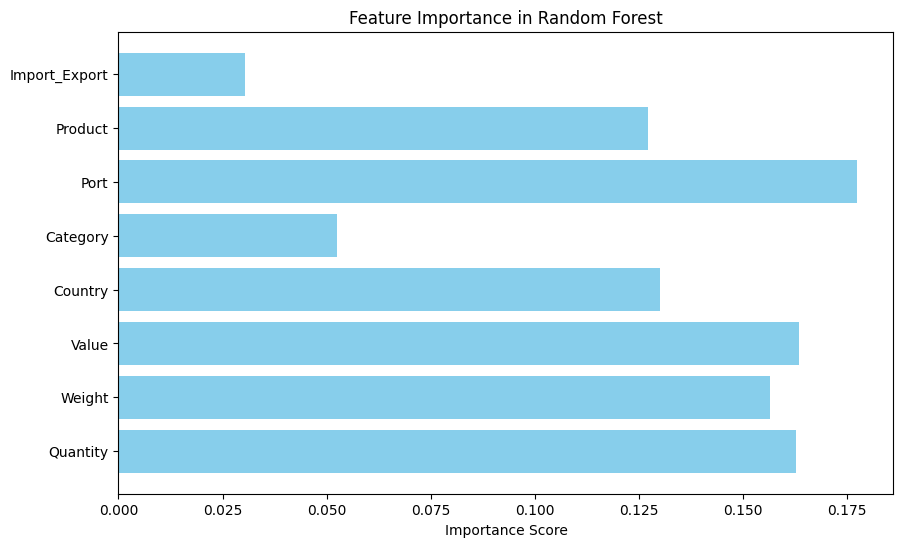


Comparison of Models:
Decision Tree Accuracy: 34.47%
Random Forest Accuracy: 33.47%


In [106]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import matplotlib.pyplot as plt

# Assuming your dataset has the columns 'Quantity', 'Weight', 'Value', and 'Import_Export'
X = ac05_df_preprocessed[['Quantity', 'Weight','Value','Country','Category','Port','Product','Import_Export']]  # Features
y = ac05_df_preprocessed['Shipping_Method']  # Target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(
    random_state=42,
    max_depth=4,
    min_samples_split=10,
    min_samples_leaf=5
)
dt_classifier.fit(X_train, y_train)
y_pred_dt = dt_classifier.predict(X_test)


# Evaluate Decision Tree
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print("\nDecision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))
print("\nDecision Tree Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_dt))

rf_classifier = RandomForestClassifier(
    n_estimators=100,       # Number of trees in the forest
    max_depth=5,            # Maximum depth of the tree
    random_state=42,
    min_samples_split=10,   # Minimum number of samples required to split a node
    min_samples_leaf=5      # Minimum number of samples required at a leaf node
)
rf_classifier.fit(X_train, y_train)
y_pred_rf = rf_classifier.predict(X_test)

# Evaluate Random Forest
accuracy_rf = accuracy_score(y_test, y_pred_rf)
print(f"\nRandom Forest Accuracy: {accuracy_rf * 100:.2f}%")
print("\nRandom Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print("\nRandom Forest Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_rf))

# Feature Importance
feature_importance = rf_classifier.feature_importances_
plt.figure(figsize=(10, 6))
plt.barh(X.columns, feature_importance, color='skyblue')
plt.xlabel('Importance Score')
plt.title('Feature Importance in Random Forest')
plt.show()

# Compare Accuracies
print("\nComparison of Models:")
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print(f"Random Forest Accuracy: {accuracy_rf * 100:.2f}%")




### **Decision Tree Model Interpretation:**

#### **Decision Tree Accuracy**: 34.47%
The Decision Tree model achieves an accuracy of **34.47%**, meaning it correctly predicts approximately one-third of the instances. This suggests that the model has room for improvement.

#### **Confusion Matrix:**
```
[[296  13  32]  <-- Actual class 0 (Air)
 [277  10  32]  <-- Actual class 1 (Land)
 [298   4  39]] <-- Actual class 2 (Sea)
```

- **Class 0 (Air) predictions**:
  - **296** instances were correctly predicted as **Air**.
  - **13** instances were incorrectly predicted as **Land**.
  - **32** instances were incorrectly predicted as **Sea**.

- **Class 1 (Land) predictions**:
  - **277** instances were incorrectly predicted as **Air**.
  - **10** instances were correctly predicted as **Land**.
  - **32** instances were incorrectly predicted as **Sea**.

- **Class 2 (Sea) predictions**:
  - **298** instances were incorrectly predicted as **Air**.
  - **4** instances were incorrectly predicted as **Land**.
  - **39** instances were correctly predicted as **Sea**.

#### **Classification Report:**

##### **For Air (Class 0):**
- **Precision (0.34)**: The model predicts **Air** correctly 34% of the time, indicating a relatively high number of false positives (misclassifying non-Air instances as Air).
- **Recall (0.87)**: The model identifies 87% of actual **Air** shipments, meaning it is effective at detecting **Air** instances.
- **F1-Score (0.49)**: The balance between precision and recall is moderate for **Air** shipments, indicating a reasonable but imperfect performance.

##### **For Land (Class 1):**
- **Precision (0.37)**: The model predicts **Land** correctly 37% of the time, indicating moderate precision but still considerable misclassification.
- **Recall (0.03)**: The model identifies only 3% of actual **Land** shipments, showing that **Land** shipments are poorly predicted.
- **F1-Score (0.06)**: This is very low, confirming that the model struggles with **Land** shipments.

##### **For Sea (Class 2):**
- **Precision (0.38)**: When predicting **Sea**, the model is correct 38% of the time.
- **Recall (0.11)**: The model identifies only 11% of actual **Sea** shipments, indicating poor performance for this class.
- **F1-Score (0.18)**: The F1-score is low, suggesting that the model's ability to predict **Sea** shipments is weak.

#### **Overall Observations:**
1. **Air Shipments (Class 0)**: The model performs well at identifying **Air** shipments with a high recall (87%), but the precision is lower (34%), meaning a lot of non-Air shipments are misclassified as Air.
2. **Land Shipments (Class 1)**: The model performs poorly with **Land** shipments, as seen from the very low recall (3%) and F1-score (0.06). **Land** shipments are frequently misclassified as **Air**.
3. **Sea Shipments (Class 2)**: The model has a poor performance with **Sea** shipments as well, with low recall (11%) and precision (38%).

#### **Macro Average and Weighted Average:**
- **Macro Average**:
  - **Precision (0.36)**, **Recall (0.34)**, and **F1-score (0.24)** indicate that the model performs weakly across all classes.
- **Weighted Average**:
  - **Precision (0.36)**, **Recall (0.34)**, and **F1-score (0.24)** are low, suggesting that the model's overall performance is not ideal.

---

### **Random Forest Model Interpretation:**

#### **Random Forest Accuracy**: 33.47%
The Random Forest model has an accuracy of **33.47%**, which is slightly lower than the Decision Tree model's accuracy. This means that the Random Forest model is also predicting about one-third of the instances correctly, showing a similar level of performance.

#### **Confusion Matrix:**
```
[[131 129  81]  <-- Actual class 0 (Air)
 [132 123  64]  <-- Actual class 1 (Land)
 [148 112  81]] <-- Actual class 2 (Sea)
```

- **Class 0 (Air) predictions**:
  - **131** instances were correctly predicted as **Air**.
  - **129** instances were incorrectly predicted as **Land**.
  - **81** instances were incorrectly predicted as **Sea**.

- **Class 1 (Land) predictions**:
  - **132** instances were incorrectly predicted as **Air**.
  - **123** instances were correctly predicted as **Land**.
  - **64** instances were incorrectly predicted as **Sea**.

- **Class 2 (Sea) predictions**:
  - **148** instances were incorrectly predicted as **Air**.
  - **112** instances were incorrectly predicted as **Land**.
  - **81** instances were correctly predicted as **Sea**.

#### **Classification Report:**

##### **For Air (Class 0):**
- **Precision (0.32)**: The model predicts **Air** correctly 32% of the time.
- **Recall (0.38)**: The model identifies 38% of actual **Air** shipments, which is better than the Decision Tree model's recall for **Air** (87%).
- **F1-Score (0.35)**: The F1-score is relatively low, suggesting poor balance between precision and recall for **Air** shipments.

##### **For Land (Class 1):**
- **Precision (0.34)**: When predicting **Land**, the model is correct 34% of the time.
- **Recall (0.39)**: The model correctly identifies 39% of actual **Land** shipments, which is better than the Decision Tree's recall for **Land** (3%).
- **F1-Score (0.36)**: The F1-score is moderate, indicating some improvement over the Decision Tree model's performance on **Land**.

##### **For Sea (Class 2):**
- **Precision (0.36)**: When predicting **Sea**, the model is correct 36% of the time.
- **Recall (0.24)**: The model identifies 24% of actual **Sea** shipments, showing poor performance for this class.
- **F1-Score (0.29)**: The F1-score is low, indicating that **Sea** shipments are also poorly predicted by the model.

#### **Overall Observations:**
1. **Air Shipments (Class 0)**: The model has relatively moderate performance for **Air** shipments, with recall (38%) higher than the Decision Tree model's recall (87%).
2. **Land Shipments (Class 1)**: The model performs somewhat better for **Land** shipments, with recall (39%) significantly better than the Decision Tree's (3%).
3. **Sea Shipments (Class 2)**: The model's performance on **Sea** shipments is weak, with low recall (24%) and precision (36%).

#### **Macro Average and Weighted Average:**
- **Macro Average**:
  - **Precision (0.34)**, **Recall (0.34)**, and **F1-score (0.33)** are relatively low, reflecting that the model does not perform well across all classes.
- **Weighted Average**:
  - **Precision (0.34)**, **Recall (0.33)**, and **F1-score (0.33)** suggest that despite slight improvements in class-specific recall, the model still has room for improvement.

---

### **Comparison of Decision Tree and Random Forest Models:**
- Both models show similar performance, with the **Decision Tree** having an accuracy of **34.47%** and the **Random Forest** having an accuracy of **33.47%**.
- **Random Forest** slightly outperforms **Decision Tree** in predicting **Land shipments** (39% recall vs 3% recall), but **Decision Tree** performs better for **Air shipments** (87% recall vs 38% recall).
- Both models struggle with **Sea shipments**, as seen from the low recall and F1-scores across both models.


Decision Tree Accuracy: 48.35%

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       0.46      0.57      0.51       474
           1       0.51      0.41      0.46       527

    accuracy                           0.48      1001
   macro avg       0.49      0.49      0.48      1001
weighted avg       0.49      0.48      0.48      1001


Decision Tree Confusion Matrix:
[[268 206]
 [311 216]]


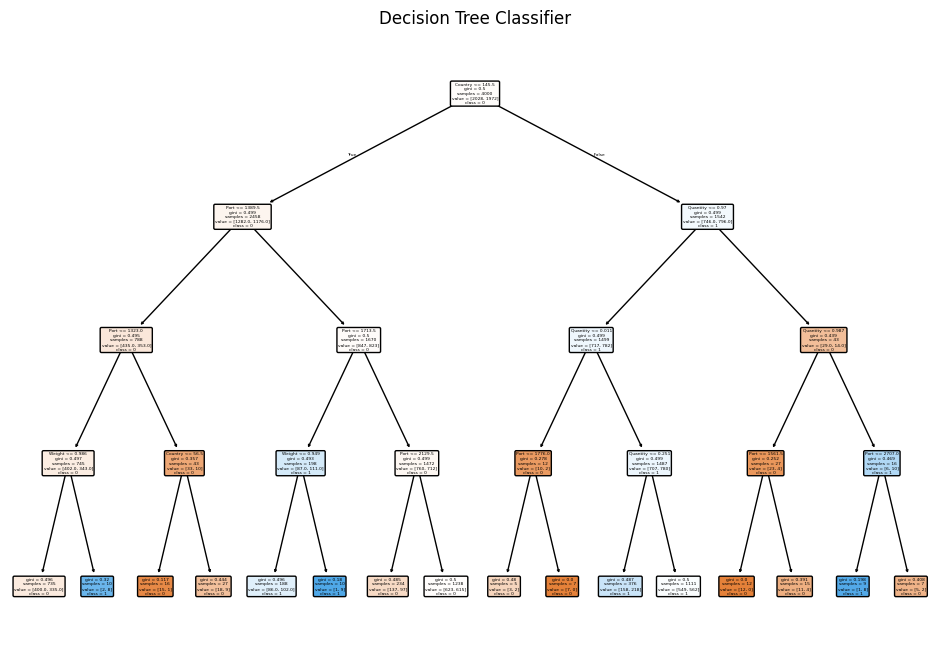


Logistic Regression Accuracy: 46.85%

Logistic Regression Classification Report:
              precision    recall  f1-score   support

           0       0.45      0.62      0.52       474
           1       0.49      0.33      0.40       527

    accuracy                           0.47      1001
   macro avg       0.47      0.48      0.46      1001
weighted avg       0.47      0.47      0.46      1001


Logistic Regression Confusion Matrix:
[[293 181]
 [351 176]]

Comparison of Models:
Decision Tree Accuracy: 48.35%
Logistic Regression Accuracy: 46.85%


In [107]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt

# Set a threshold for classification (e.g., 0.5)
threshold = 0.5

# Convert the scaled 'Value' column to binary categories (0 or 1)
ac05_df_preprocessed['Value_Category'] = ac05_df_preprocessed['Value'].apply(lambda x: 1 if x > threshold else 0)

# Define your features (X) and target (y)
X = ac05_df_preprocessed[['Quantity', 'Weight', 'Category', 'Country', 'Port', 'Shipping_Method']]  # Features
y = ac05_df_preprocessed['Value_Category']  # Target

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Decision Tree Classifier
dt_classifier = DecisionTreeClassifier(random_state=42, max_depth=4, min_samples_split=10, min_samples_leaf=5)
dt_classifier.fit(X_train, y_train)
y_pred_dt = dt_classifier.predict(X_test)

# Logistic Regression
log_reg = LogisticRegression(random_state=42, max_iter=1000, solver='lbfgs')
log_reg.fit(X_train, y_train)
y_pred_lr = log_reg.predict(X_test)

# Evaluate Decision Tree
accuracy_dt = accuracy_score(y_test, y_pred_dt)
print(f"\nDecision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print("\nDecision Tree Classification Report:")
print(classification_report(y_test, y_pred_dt))
print("\nDecision Tree Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_dt))

# Visualize the Decision Tree
plt.figure(figsize=(12, 8))
from sklearn.tree import plot_tree
plot_tree(dt_classifier, filled=True, feature_names=X.columns, class_names=[str(cls) for cls in y.unique()], rounded=True)
plt.title("Decision Tree Classifier")
plt.show()

# Evaluate Logistic Regression
accuracy_lr = accuracy_score(y_test, y_pred_lr)
print(f"\nLogistic Regression Accuracy: {accuracy_lr * 100:.2f}%")
print("\nLogistic Regression Classification Report:")
print(classification_report(y_test, y_pred_lr))
print("\nLogistic Regression Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_lr))

# Compare Accuracies
print("\nComparison of Models:")
print(f"Decision Tree Accuracy: {accuracy_dt * 100:.2f}%")
print(f"Logistic Regression Accuracy: {accuracy_lr * 100:.2f}%")


1. **Decision Tree Classifier**:
   - **Accuracy**: 48.35%
   - **Precision**: For class `0`, it is 0.46, and for class `1`, it is 0.51.
   - **Recall**: For class `0`, it is 0.57, and for class `1`, it is 0.41.
   - **F1-Score**: For class `0`, it is 0.51, and for class `1`, it is 0.46.
   - The confusion matrix shows a higher number of false positives and false negatives, indicating that both classes are being misclassified at certain rates.
   
2. **Logistic Regression**:
   - **Accuracy**: 46.85%
   - **Precision**: For class `0`, it is 0.45, and for class `1`, it is 0.49.
   - **Recall**: For class `0`, it is 0.62, and for class `1`, it is 0.33.
   - **F1-Score**: For class `0`, it is 0.52, and for class `1`, it is 0.40.
   - The confusion matrix for logistic regression shows a similar trend, with a higher number of false negatives for class `1`.

### Key Insights:

- Both **Decision Tree** and **Logistic Regression** models show relatively low accuracy (~48% and ~47% respectively).
- The **Decision Tree** classifier tends to perform better on **recall** for class `0`, but struggles with class `1` due to lower recall.
- The **Logistic Regression** model performs better on **recall** for class `0` but shows a significant drop in recall for class `1`.
- **Class Imbalance**: It seems there is some class imbalance, with class `1` being underrepresented in terms of recall, which can lead to misclassification.